In [1]:

import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
from itertools import combinations_with_replacement
import functools



In [2]:

df = pd.read_csv('Dataset/winequality-red.csv',sep = ';')

In [3]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [4]:
df = df.sample(frac=1) 

In [5]:
X = df.drop(columns = 'quality') #data matrix
y = df['quality']  #quality

X = np.array(X)  # to np array 
y = np.array(y)   # to np array

In [6]:
best_features = ['volatile acidity', 'density', 'pH', 'sulphates', 'alcohol']
best_df = df[best_features]
X = np.array(best_df)

In [7]:
def split_trainTest(X,y,t):
    train_size = int((1-t) * X.shape[0])   
    return X[:train_size],X[train_size:],y[:train_size],y[train_size:]

In [8]:
X_train, X_test, y_train, y_test = split_trainTest(X,y,t=0.2)

In [9]:
X_train = (X_train - np.mean(X_train))/np.std(X_train)
X_test = (X_test - np.mean(X_test))/np.std(X_test)

In [10]:
'''
import warnings
warnings.filterwarnings('ignore')


# Matplotlib and seaborn for plotting
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
from scipy import stats

# Calculate correlation coefficient
def corrfunc(x, y, **kws):
    r, _ = stats.pearsonr(x, y)
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r),
                xy=(.1, .6), xycoords=ax.transAxes,
               size = 24)
    
cmap = sns.cubehelix_palette(light=1, dark = 0.1,
                             hue = 0.5, as_cmap=True)

sns.set_context(font_scale=2)

# Pair grid set up
g = sns.PairGrid(df)

# Scatter plot on the upper triangle
g.map_upper(plt.scatter, s=10, color = 'red')

# Distribution on the diagonal
g.map_diag(sns.distplot, kde=False, color = 'red')

# Density Plot and Correlation coefficients on the lower triangle
g.map_lower(sns.kdeplot, cmap = cmap)
g.map_lower(corrfunc);
'''

'\nimport warnings\nwarnings.filterwarnings(\'ignore\')\n\n\n# Matplotlib and seaborn for plotting\nimport matplotlib.pyplot as plt\n%matplotlib inline\n\nimport seaborn as sns\nfrom scipy import stats\n\n# Calculate correlation coefficient\ndef corrfunc(x, y, **kws):\n    r, _ = stats.pearsonr(x, y)\n    ax = plt.gca()\n    ax.annotate("r = {:.2f}".format(r),\n                xy=(.1, .6), xycoords=ax.transAxes,\n               size = 24)\n    \ncmap = sns.cubehelix_palette(light=1, dark = 0.1,\n                             hue = 0.5, as_cmap=True)\n\nsns.set_context(font_scale=2)\n\n# Pair grid set up\ng = sns.PairGrid(df)\n\n# Scatter plot on the upper triangle\ng.map_upper(plt.scatter, s=10, color = \'red\')\n\n# Distribution on the diagonal\ng.map_diag(sns.distplot, kde=False, color = \'red\')\n\n# Density Plot and Correlation coefficients on the lower triangle\ng.map_lower(sns.kdeplot, cmap = cmap)\ng.map_lower(corrfunc);\n'

In [10]:

# 1 polynomialFeatures(X, degree) function

def polynomialFeatures(x,degree = 2):
    x_t = x.T
    features = np.ones(len(x))
    for degree in range(1, degree + 1):
        for items in combinations_with_replacement(x_t, degree):
            features = np.vstack((features,functools.reduce(lambda x, y: x * y, items)))
    return features.T



In [11]:

# 2 mse(Y_true, Y_pred) function

def mse(Y_true, Y_pred):
    E = np.array(Y_true).reshape(-1,1) - np.array(Y_pred).reshape(-1,1)
    mse = 1/np.array(Y_true).shape[0] * (E.T.dot(E))
    return mse[(0,0)]

In [12]:

# 3 learning_curve function

def k_partition(data,kfold):
    return np.array_split(data,kfold)

def kfold_error(model, X, Y, k_fold, learning_rate = 0.01, epochs = 1000, 
                tol = None, regularizer = None, lambd = 0.0, **kwargs):
    if(Y.shape == (Y.shape[0],)):
        Y = np.expand_dims(Y,axis=1)
    dataset = np.concatenate([X,Y],axis=1)

    k_part = k_partition(dataset, k_fold)   # using the function_1 k_partition
    
    error_training = []
    error_validation = []

    for idx,val in enumerate(k_part):
        validation_Y = val[:,-1]
        validation_X = val[:,:-1]
        train = np.concatenate(np.delete(k_part,idx,0))
        train_Y = train[:,-1]
        train_X = train[:,:-1]          
    
        # with sklearn Linearregression to test the entire function
        # replace it when our modeling function is done.
        #reg = model().fit(train_X, train_Y)
        #pr_train_Y = reg.predict(train_X)
        #pr_validation_Y = reg.predict(validation_X)
        #mse_train_Y = mse(train_Y, pr_train_Y)
        #mse_validation_Y = mse(validation_Y, pr_validation_Y)
    
#         # using our modeling function
        model = Linear_Regression()
        model.fit(train_X,train_Y,learning_rate=learning_rate,epochs=epochs,regularizer=regularizer,lambd= lambd, tol=tol)
        pr_train_Y = model.predict(train_X)
        pr_validation_Y = model.predict(validation_X)
        mse_train_Y = mse(train_Y, pr_train_Y)
        mse_validation_Y = mse(validation_Y, pr_validation_Y)

        error_training.append(mse_train_Y)
        error_validation.append(mse_validation_Y)

    # return the average mse for the training and the validation fold.
    return np.array(error_training).mean(), np.array(error_validation).mean()


def learning_curve(model, X, Y, cv, train_size = 1, learning_rate = 0.01, 
                   epochs = 1000, tol = None, regularizer = None, lambd = 0.0, **kwargs):
    
    
    if type(train_size) == int and train_size > 1: 
        train_size_abs = train_size
    elif train_size > 0 and train_size <= 1:
        train_size_abs = int(train_size * X.shape[0])
    else:
        print(f'unaceptable train_size of {train_size}')
        
    if X.shape[0] % train_size_abs != 0:
        t = X.shape[0] // train_size_abs + 1
    else:
        t = X.shape[0] // train_size_abs
    
    t0 = 1
    num_samples_list = []
    rmse_training_list = []
    rmse_validation_list = []

    while t0 <= t:
        i = t0 * train_size_abs
        if i >= X.shape[0]: i = X.shape[0]
        index = np.arange(i)
        X_split = (X[index])
        Y_split = (Y[index])
        
        # using the function_2 to calculate the mse, and then rmse using k-fold based on varying training samples.
        rmse_tr, rmse_va = np.sqrt(kfold_error(model, X_split, Y_split, cv, learning_rate = learning_rate, 
                                               epochs = epochs, tol = tol, regularizer = regularizer, lambd = lambd))
        num_samples_list.append(i)
        rmse_training_list.append(rmse_tr)
        rmse_validation_list.append(rmse_va)
        t0 += 1

    result = {'num_samples':pd.Series(num_samples_list), 
              'train_scores':pd.Series(rmse_training_list), 'val_score':pd.Series(rmse_validation_list)}
    learning_curve_elements = pd.DataFrame(result)
    
    return np.array(learning_curve_elements["train_scores"]), \
            np.array(learning_curve_elements["val_score"]), np.array(learning_curve_elements["num_samples"]), \
            learning_curve_elements


In [13]:

# 4 plot_polynomial_model_complexity function

def plot_polynomial_model_complexity(model, X, Y, cv, maxPolynomialDegree, 
                                     learning_rate=0.01, epochs=1000, tol=None, regularizer=None, lambd=0.0, **kwargs):
    
    poly_list = []
    rmse_training_list = []
    rmse_validation_list = []
    
    for i in range(1, maxPolynomialDegree+1):
        
        # Here should be replaced with our #1 function polynomialFeatures(X, degree)
        X_poly = polynomialFeatures(X, i)
        Y_poly = polynomialFeatures(X, i)
        print(f'X shape = {X_poly.shape} #### learning_rate = {learning_rate}   ##### Degree = {i} ## epoch:{epochs}')
        
        rmse_tr, rmse_va = np.sqrt(kfold_error(model, X_poly, Y_poly, cv, learning_rate = learning_rate, 
                                               epochs = epochs, tol = tol, regularizer = regularizer, lambd = lambd))
        learning_rate *= 0.1
        poly_list.append(i)
        rmse_training_list.append(rmse_tr)
        rmse_validation_list.append(rmse_va)
        
    # plot the RMSE using the list above.
    plt.figure(figsize = (10, 10))
    
    # linewidth and fontsize
    lw = 2
    fontsize = 20
    
    # plot curves
    plt.plot(poly_list, rmse_training_list, 'o-', color='green', lw = lw, label = "Training set") 
    plt.plot(poly_list, rmse_validation_list, 'o-', color='red', lw = lw, label = "Validation set") 
            
    # add title, xlabel, ylabel, and legend. 
    plt.title('RMSE curve', fontsize = fontsize)
    plt.xlabel('Polynomial Degree', fontsize = fontsize)
    plt.ylabel('RMSE', fontsize = fontsize)
    plt.legend(loc="best", fontsize = fontsize)
    plt.xticks(np.arange(1, i+1, 1))
    
    plt.show()
    

In [14]:
class Linear_Regression:
    def __init__(self):
        pass   
    
    def fit(self, X, Y, learning_rate=0.01, epochs=1000, tol=None, regularizer=None,lambd=0.0,**kwargs):
        epch_counter = 0
        m,n = X.shape
        self.theta = np.zeros(n) # Initialize theta to be 0 of size n
        if(tol != None):
            self.error = -tol
        else:
            self.error = -1e5
        while epch_counter < epochs:
            epch_counter += 1 #count the epochs
            theta = self.theta
            error = self.error
            
            a = np.dot(X.T,(X @ theta - Y)) # gradient of loss wrt parameter  
            if(regularizer == 'l2'):
                self.theta = theta - ((a * learning_rate) / m) - (learning_rate * lambd*theta)/m
            elif(regularizer == 'l1'):
                self.theta = theta - ((a * learning_rate) / m) - (learning_rate * lambd* np.sign(theta))/m
            else:
                self.theta = theta - ((a * learning_rate) / m)
            
            
            self.error = mse(Y,X @ self.theta)
            if(tol != None):
                
                if np.abs(self.error - error) < tol:
                    break
            print(f'Epoch : {epch_counter}     ||      Error : {self.error}')
            print('='*20)
           # if np.linalg.norm(self.theta - theta, ord=1) < tol:
               # break

        print(f'Epochs needed: {epch_counter}')
                                  
    def predict(self,X):
        return X @ self.theta

In [21]:
################# Add learning rate scheduler (Geron chapter 4)
t0,t1 = 5 , 50

def learning_schedule(t):
    return t0 / (t - t1)

class SGD:
    def __init__(self):
        pass   
    
    def fit(self, X, Y, learning_rate=0.01, epochs=1000, tol=None, regularizer=None,lambd=0.0,**kwargs):
        epch_counter = 0
        m,n = X.shape
        self.theta = np.zeros(n) # Initialize theta to be 0 of size n
        self.error = -tol
        while epch_counter < epochs:
            epch_counter += 1 #count the epochs
            for i in range(m):
                learning_rate = learning_schedule(epochs * m + i)
                theta = self.theta
                error = self.error
                a = np.dot(X[i].T , (X[i] @ self.theta - Y[i]))
                if(regularizer == 'l2'):
                #j_theta = j_theta + (np.dot(theta[1:].T,theta[1:]) *(lambd /(2*m)))
                    self.theta = theta - (a * learning_rate) - (learning_rate * lambd*theta)
                
                elif(regularizer == 'l1'):
                #j_theta = j_theta + (theta[1:].sum() *(lambd /(2*m)))
                    self.theta = theta - (a * learning_rate) - (learning_rate * lambd* np.sign(theta))
                else:
                    self.theta = theta - (a * learning_rate)
                #if np.linalg.norm(self.theta - theta, ord=1) < tol:
                #    break
                
                self.error = mse(Y,X @ self.theta)
                
                if np.abs(self.error - error) < tol:
                    break
        print(f'Epochs needed: {epch_counter}')
                                  
    def predict(self,X):
        return X @ self.theta

In [17]:
def sFold(folds,data,labels,model,error_fuction,**model_args):
#def sFold(folds,data,labels,model,error_fuction,**model_args):
    if(labels.shape == (labels.shape[0],)):
        labels = np.expand_dims(labels,axis=1)
    dataset = np.concatenate([data,labels],axis=1)
    s_part = s_partition(dataset,folds)
    pred_y = []
    true_y = []
    for idx,val in enumerate(s_part):
        test_y = val[:,-1]
        #test_y = np.expand_dims(test_y, axis=1)
        test = val[:,:-1]
        train = np.concatenate(np.delete(s_part,idx,0))
        label = train[:,-1]
        train = train[:,:-1]        
        model.fit(train,label,**model_args)       
        pred = model.predict(test)
        pred_y.append(pred)
        true_y.append(test_y)
    pred_y = np.concatenate(pred_y)
    true_y = np.concatenate(true_y)

    avg_error = error_fuction(pred_y,true_y).mean()   
    result = {'Expected labels':true_y, 'Predicted labels': pred_y,'Average error':avg_error }
    return result


#helper
def s_partition(x,s):
    return np.array_split(x,3)

In [18]:
X_train = polynomialFeatures(X_train,1)
X_test = polynomialFeatures(X_test,1)
validation_accuracy = np.empty((4,6,2))
lambd= [1.0, 0,0.1,0.01, 0.001, 0.0001]
learning_rate = [0.1, 0.01, 0.001, 0.001]
regularizer= ['l1', 'l2']
minScore = 1e10
for i,lr in enumerate(learning_rate):
    for j,ld in enumerate(lambd):
        for x,rg in enumerate(regularizer):
            lnreg = Linear_Regression()
            model_args = {'learning_rate' : lr,'lambd':ld,'regularizer' : rg,'epochs' : 500}
            result = sFold(5,X_train,y_train,lnreg,error_fuction = mse,**model_args)
            validation_accuracy[i,j,x] = result['Average error']
            if validation_accuracy[i,j,x] < minScore:
                minScore = validation_accuracy[i,j,x]
                index = [i,j,x]
            
                
                

Epoch : 1     ||      Error : 5.658596311493932
Epoch : 2     ||      Error : 1.3624083354954446
Epoch : 3     ||      Error : 0.6689601588667715
Epoch : 4     ||      Error : 0.5567120326933426
Epoch : 5     ||      Error : 0.5383147561753567
Epoch : 6     ||      Error : 0.5351091819051554
Epoch : 7     ||      Error : 0.5343779777606124
Epoch : 8     ||      Error : 0.5340563901522127
Epoch : 9     ||      Error : 0.5338057206094182
Epoch : 10     ||      Error : 0.5335690231437269
Epoch : 11     ||      Error : 0.533336173348744
Epoch : 12     ||      Error : 0.5331051566758994
Epoch : 13     ||      Error : 0.5328754914598507
Epoch : 14     ||      Error : 0.5326470336984919
Epoch : 15     ||      Error : 0.5324197301990174
Epoch : 16     ||      Error : 0.532193557032944
Epoch : 17     ||      Error : 0.5319685008817014
Epoch : 18     ||      Error : 0.5317445525229197
Epoch : 19     ||      Error : 0.5315217043723367
Epoch : 20     ||      Error : 0.531299949522064
Epoch : 21   

Epoch : 122     ||      Error : 0.4886246672572594
Epoch : 123     ||      Error : 0.48855311854534983
Epoch : 124     ||      Error : 0.4884818489771965
Epoch : 125     ||      Error : 0.48841085699051545
Epoch : 126     ||      Error : 0.4883401410322224
Epoch : 127     ||      Error : 0.48826969955837746
Epoch : 128     ||      Error : 0.4881995310341305
Epoch : 129     ||      Error : 0.48812963393366815
Epoch : 130     ||      Error : 0.4880600067401593
Epoch : 131     ||      Error : 0.4879906479457023
Epoch : 132     ||      Error : 0.4879215560512714
Epoch : 133     ||      Error : 0.48785272956666437
Epoch : 134     ||      Error : 0.4877841670104501
Epoch : 135     ||      Error : 0.4877158669099163
Epoch : 136     ||      Error : 0.487647827801018
Epoch : 137     ||      Error : 0.4875800482283258
Epoch : 138     ||      Error : 0.48751252674497497
Epoch : 139     ||      Error : 0.48744526191261417
Epoch : 140     ||      Error : 0.48737825230135556
Epoch : 141     ||      

Epoch : 338     ||      Error : 0.48438449912544707
Epoch : 339     ||      Error : 0.4843461283101884
Epoch : 340     ||      Error : 0.484307860367509
Epoch : 341     ||      Error : 0.4842696947626685
Epoch : 342     ||      Error : 0.4842316309641121
Epoch : 343     ||      Error : 0.484193668443451
Epoch : 344     ||      Error : 0.48415580667544345
Epoch : 345     ||      Error : 0.4841180451379752
Epoch : 346     ||      Error : 0.4840803833120405
Epoch : 347     ||      Error : 0.4840428206817234
Epoch : 348     ||      Error : 0.4840053567341786
Epoch : 349     ||      Error : 0.4839679909596133
Epoch : 350     ||      Error : 0.48393072285126776
Epoch : 351     ||      Error : 0.4838935519053977
Epoch : 352     ||      Error : 0.48385647762125505
Epoch : 353     ||      Error : 0.4838194995010706
Epoch : 354     ||      Error : 0.4837826170500353
Epoch : 355     ||      Error : 0.4837458297762821
Epoch : 356     ||      Error : 0.4837091371908687
Epoch : 357     ||      Error

Epoch : 452     ||      Error : 0.4869817846005265
Epoch : 453     ||      Error : 0.48693545457583465
Epoch : 454     ||      Error : 0.48688922456610734
Epoch : 455     ||      Error : 0.486843094078153
Epoch : 456     ||      Error : 0.4867970626217116
Epoch : 457     ||      Error : 0.4867511297094358
Epoch : 458     ||      Error : 0.48670529485687414
Epoch : 459     ||      Error : 0.48665955758245305
Epoch : 460     ||      Error : 0.4866139174074591
Epoch : 461     ||      Error : 0.4865683738560221
Epoch : 462     ||      Error : 0.48652292645509765
Epoch : 463     ||      Error : 0.48647757473445014
Epoch : 464     ||      Error : 0.48643231822663485
Epoch : 465     ||      Error : 0.4863871564669822
Epoch : 466     ||      Error : 0.48634208899358006
Epoch : 467     ||      Error : 0.4862971153472574
Epoch : 468     ||      Error : 0.48625223507156723
Epoch : 469     ||      Error : 0.4862074477127705
Epoch : 470     ||      Error : 0.48616275281981913
Epoch : 471     ||    

Epoch : 193     ||      Error : 0.5045976704157105
Epoch : 194     ||      Error : 0.5044953535665879
Epoch : 195     ||      Error : 0.5043934451410854
Epoch : 196     ||      Error : 0.5042919427875572
Epoch : 197     ||      Error : 0.5041908441685999
Epoch : 198     ||      Error : 0.5040901469609673
Epoch : 199     ||      Error : 0.5039898488554826
Epoch : 200     ||      Error : 0.5038899475569534
Epoch : 201     ||      Error : 0.5037904407840869
Epoch : 202     ||      Error : 0.5036913262694047
Epoch : 203     ||      Error : 0.5035926017591588
Epoch : 204     ||      Error : 0.503494265013248
Epoch : 205     ||      Error : 0.5033963138051353
Epoch : 206     ||      Error : 0.5032987459217638
Epoch : 207     ||      Error : 0.5032015591634769
Epoch : 208     ||      Error : 0.5031047513439344
Epoch : 209     ||      Error : 0.503008320290033
Epoch : 210     ||      Error : 0.5029122638418249
Epoch : 211     ||      Error : 0.5028165798524378
Epoch : 212     ||      Error : 0

Epoch : 444     ||      Error : 0.47367854623688066
Epoch : 445     ||      Error : 0.47364958436280546
Epoch : 446     ||      Error : 0.47362067605437563
Epoch : 447     ||      Error : 0.4735918210583334
Epoch : 448     ||      Error : 0.47356301912289595
Epoch : 449     ||      Error : 0.4735342699977461
Epoch : 450     ||      Error : 0.47350557343402444
Epoch : 451     ||      Error : 0.47347692918431966
Epoch : 452     ||      Error : 0.4734483370026611
Epoch : 453     ||      Error : 0.47341979664450895
Epoch : 454     ||      Error : 0.4733913078667466
Epoch : 455     ||      Error : 0.47336287042767167
Epoch : 456     ||      Error : 0.473334484086988
Epoch : 457     ||      Error : 0.4733061486057969
Epoch : 458     ||      Error : 0.47327786374658887
Epoch : 459     ||      Error : 0.4732496292732358
Epoch : 460     ||      Error : 0.47322144495098184
Epoch : 461     ||      Error : 0.4731933105464364
Epoch : 462     ||      Error : 0.47316522582756476
Epoch : 463     ||   

Epoch : 129     ||      Error : 0.487786237450847
Epoch : 130     ||      Error : 0.4877145881225517
Epoch : 131     ||      Error : 0.48764322375041963
Epoch : 132     ||      Error : 0.4875721427149884
Epoch : 133     ||      Error : 0.48750134340641244
Epoch : 134     ||      Error : 0.4874308242244046
Epoch : 135     ||      Error : 0.4873605835781802
Epoch : 136     ||      Error : 0.48729061988639966
Epoch : 137     ||      Error : 0.4872209315771122
Epoch : 138     ||      Error : 0.4871515170877001
Epoch : 139     ||      Error : 0.48708237486482303
Epoch : 140     ||      Error : 0.48701350336436217
Epoch : 141     ||      Error : 0.48694490105136606
Epoch : 142     ||      Error : 0.4868765663999951
Epoch : 143     ||      Error : 0.4868084978934677
Epoch : 144     ||      Error : 0.4867406940240062
Epoch : 145     ||      Error : 0.4866731532927829
Epoch : 146     ||      Error : 0.4866058742098667
Epoch : 147     ||      Error : 0.4865388552941703
Epoch : 148     ||      Er

Epoch : 352     ||      Error : 0.4835609974112093
Epoch : 353     ||      Error : 0.4835230519983786
Epoch : 354     ||      Error : 0.4834852024050273
Epoch : 355     ||      Error : 0.4834474481358101
Epoch : 356     ||      Error : 0.48340978869827816
Epoch : 357     ||      Error : 0.4833722236028624
Epoch : 358     ||      Error : 0.48333475236285667
Epoch : 359     ||      Error : 0.48329737449439997
Epoch : 360     ||      Error : 0.48326008951646005
Epoch : 361     ||      Error : 0.4832228969508171
Epoch : 362     ||      Error : 0.48318579632204606
Epoch : 363     ||      Error : 0.4831487871575011
Epoch : 364     ||      Error : 0.48311186898729847
Epoch : 365     ||      Error : 0.4830750413443001
Epoch : 366     ||      Error : 0.483038303764098
Epoch : 367     ||      Error : 0.4830016557849972
Epoch : 368     ||      Error : 0.48296509694800055
Epoch : 369     ||      Error : 0.4829286267967917
Epoch : 370     ||      Error : 0.4828922448777205
Epoch : 371     ||      E

Epoch : 491     ||      Error : 0.48525278802863353
Epoch : 492     ||      Error : 0.4852100173359541
Epoch : 493     ||      Error : 0.48516732943652524
Epoch : 494     ||      Error : 0.4851247239393352
Epoch : 495     ||      Error : 0.4850822004556819
Epoch : 496     ||      Error : 0.48503975859915943
Epoch : 497     ||      Error : 0.48499739798564284
Epoch : 498     ||      Error : 0.48495511823327586
Epoch : 499     ||      Error : 0.48491291896245603
Epoch : 500     ||      Error : 0.4848707997958216
Epochs needed: 500
Epoch : 1     ||      Error : 5.693818870868763
Epoch : 2     ||      Error : 1.3583411233950426
Epoch : 3     ||      Error : 0.6482053971851304
Epoch : 4     ||      Error : 0.5317885821918121
Epoch : 5     ||      Error : 0.5126059344554416
Epoch : 6     ||      Error : 0.5093482909869701
Epoch : 7     ||      Error : 0.5086994536111762
Epoch : 8     ||      Error : 0.5084785057242928
Epoch : 9     ||      Error : 0.5083282202418182
Epoch : 10     ||      Er

Epoch : 204     ||      Error : 0.50349702668111
Epoch : 205     ||      Error : 0.5033990931791938
Epoch : 206     ||      Error : 0.5033015429954684
Epoch : 207     ||      Error : 0.503204373930029
Epoch : 208     ||      Error : 0.5031075837962941
Epoch : 209     ||      Error : 0.5030111704209228
Epoch : 210     ||      Error : 0.5029151316437355
Epoch : 211     ||      Error : 0.5028194653176328
Epoch : 212     ||      Error : 0.5027241693085163
Epoch : 213     ||      Error : 0.502629241495209
Epoch : 214     ||      Error : 0.5025346797693774
Epoch : 215     ||      Error : 0.5024404820354518
Epoch : 216     ||      Error : 0.5023466462105504
Epoch : 217     ||      Error : 0.5022531702244001
Epoch : 218     ||      Error : 0.5021600520192614
Epoch : 219     ||      Error : 0.5020672895498508
Epoch : 220     ||      Error : 0.5019748807832659
Epoch : 221     ||      Error : 0.501882823698909
Epoch : 222     ||      Error : 0.5017911162884127
Epoch : 223     ||      Error : 0.50

Epoch : 492     ||      Error : 0.47234916138949595
Epoch : 493     ||      Error : 0.47232251952295706
Epoch : 494     ||      Error : 0.47229592059278064
Epoch : 495     ||      Error : 0.4722693644074738
Epoch : 496     ||      Error : 0.47224285077665124
Epoch : 497     ||      Error : 0.4722163795110277
Epoch : 498     ||      Error : 0.47218995042241185
Epoch : 499     ||      Error : 0.4721635633237003
Epoch : 500     ||      Error : 0.47213721802887
Epochs needed: 500
Epoch : 1     ||      Error : 5.658596311493932
Epoch : 2     ||      Error : 1.3613588793692306
Epoch : 3     ||      Error : 0.6683613119239242
Epoch : 4     ||      Error : 0.5564320270698204
Epoch : 5     ||      Error : 0.5381823681192462
Epoch : 6     ||      Error : 0.5350366159059231
Epoch : 7     ||      Error : 0.5343269402870111
Epoch : 8     ||      Error : 0.5340110435732796
Epoch : 9     ||      Error : 0.533759659487748
Epoch : 10     ||      Error : 0.5335196960644341
Epoch : 11     ||      Error :

Epoch : 271     ||      Error : 0.4797895327584453
Epoch : 272     ||      Error : 0.4797457719516671
Epoch : 273     ||      Error : 0.4797021409717657
Epoch : 274     ||      Error : 0.4796586391169406
Epoch : 275     ||      Error : 0.4796152656895408
Epoch : 276     ||      Error : 0.4795720199960391
Epoch : 277     ||      Error : 0.4795289013470086
Epoch : 278     ||      Error : 0.4794859090570977
Epoch : 279     ||      Error : 0.47944304244500563
Epoch : 280     ||      Error : 0.4794003008334583
Epoch : 281     ||      Error : 0.4793576835491849
Epoch : 282     ||      Error : 0.4793151899228933
Epoch : 283     ||      Error : 0.47927281928924664
Epoch : 284     ||      Error : 0.4792305709868396
Epoch : 285     ||      Error : 0.4791884443581752
Epoch : 286     ||      Error : 0.47914643874964136
Epoch : 287     ||      Error : 0.47910455351148734
Epoch : 288     ||      Error : 0.47906278799780144
Epoch : 289     ||      Error : 0.4790211415664875
Epoch : 290     ||      Er

Epoch : 391     ||      Error : 0.4821111064365339
Epoch : 392     ||      Error : 0.4820764493778002
Epoch : 393     ||      Error : 0.48204187081744077
Epoch : 394     ||      Error : 0.4820073703607695
Epoch : 395     ||      Error : 0.4819729476153969
Epoch : 396     ||      Error : 0.48193860219121604
Epoch : 397     ||      Error : 0.48190433370039
Epoch : 398     ||      Error : 0.48187014175733733
Epoch : 399     ||      Error : 0.4818360259787199
Epoch : 400     ||      Error : 0.4818019859834287
Epoch : 401     ||      Error : 0.4817680213925712
Epoch : 402     ||      Error : 0.48173413182945796
Epoch : 403     ||      Error : 0.4817003169195899
Epoch : 404     ||      Error : 0.48166657629064513
Epoch : 405     ||      Error : 0.48163290957246613
Epoch : 406     ||      Error : 0.4815993163970472
Epoch : 407     ||      Error : 0.4815657963985213
Epoch : 408     ||      Error : 0.48153234921314797
Epoch : 409     ||      Error : 0.48149897447930035
Epoch : 410     ||      E

Epoch : 197     ||      Error : 0.49098716418398686
Epoch : 198     ||      Error : 0.49092590947473813
Epoch : 199     ||      Error : 0.49086487633182574
Epoch : 200     ||      Error : 0.4908040635220403
Epoch : 201     ||      Error : 0.49074346981942574
Epoch : 202     ||      Error : 0.49068309400523547
Epoch : 203     ||      Error : 0.4906229348678908
Epoch : 204     ||      Error : 0.49056299120293834
Epoch : 205     ||      Error : 0.4905032618130071
Epoch : 206     ||      Error : 0.49044374550776754
Epoch : 207     ||      Error : 0.49038444110388946
Epoch : 208     ||      Error : 0.4903253474250009
Epoch : 209     ||      Error : 0.4902664633016463
Epoch : 210     ||      Error : 0.4902077875712468
Epoch : 211     ||      Error : 0.4901493190780584
Epoch : 212     ||      Error : 0.4900910566731322
Epoch : 213     ||      Error : 0.49003299921427423
Epoch : 214     ||      Error : 0.4899751455660052
Epoch : 215     ||      Error : 0.4899174945995208
Epoch : 216     ||    

Epoch : 305     ||      Error : 0.4952189831637579
Epoch : 306     ||      Error : 0.49515056349342457
Epoch : 307     ||      Error : 0.49508236052057025
Epoch : 308     ||      Error : 0.4950143730524241
Epoch : 309     ||      Error : 0.4949465999034017
Epoch : 310     ||      Error : 0.4948790398950624
Epoch : 311     ||      Error : 0.4948116918560649
Epoch : 312     ||      Error : 0.4947445546221246
Epoch : 313     ||      Error : 0.4946776270359702
Epoch : 314     ||      Error : 0.49461090794730156
Epoch : 315     ||      Error : 0.49454439621274676
Epoch : 316     ||      Error : 0.49447809069582016
Epoch : 317     ||      Error : 0.4944119902668806
Epoch : 318     ||      Error : 0.4943460938030894
Epoch : 319     ||      Error : 0.4942804001883695
Epoch : 320     ||      Error : 0.49421490831336345
Epoch : 321     ||      Error : 0.49414961707539357
Epoch : 322     ||      Error : 0.49408452537842046
Epoch : 323     ||      Error : 0.49401963213300304
Epoch : 324     ||    

Epoch : 40     ||      Error : 0.7638286747378092
Epoch : 41     ||      Error : 0.7372847573761873
Epoch : 42     ||      Error : 0.7138171177597512
Epoch : 43     ||      Error : 0.6930687419677702
Epoch : 44     ||      Error : 0.6747240594707287
Epoch : 45     ||      Error : 0.6585041316183244
Epoch : 46     ||      Error : 0.6441623987736141
Epoch : 47     ||      Error : 0.6314809212288253
Epoch : 48     ||      Error : 0.6202670565699046
Epoch : 49     ||      Error : 0.6103505228139221
Epoch : 50     ||      Error : 0.6015808025275254
Epoch : 51     ||      Error : 0.593824848335488
Epoch : 52     ||      Error : 0.586965054825368
Epoch : 53     ||      Error : 0.5808974659174946
Epoch : 54     ||      Error : 0.5755301903609084
Epoch : 55     ||      Error : 0.5707820011902862
Epoch : 56     ||      Error : 0.566581097784693
Epoch : 57     ||      Error : 0.5628640116490286
Epoch : 58     ||      Error : 0.5595746392311011
Epoch : 59     ||      Error : 0.5566633870247911
Epo

Epoch : 172     ||      Error : 0.49812778144729236
Epoch : 173     ||      Error : 0.49811637276137793
Epoch : 174     ||      Error : 0.4981049704893168
Epoch : 175     ||      Error : 0.498093574535632
Epoch : 176     ||      Error : 0.4980821848122109
Epoch : 177     ||      Error : 0.4980708012376526
Epoch : 178     ||      Error : 0.49805942373667933
Epoch : 179     ||      Error : 0.4980480522396041
Epoch : 180     ||      Error : 0.4980366866818503
Epoch : 181     ||      Error : 0.49802532700351637
Epoch : 182     ||      Error : 0.49801397314898144
Epoch : 183     ||      Error : 0.4980026250665485
Epoch : 184     ||      Error : 0.49799128270812004
Epoch : 185     ||      Error : 0.49797994602890366
Epoch : 186     ||      Error : 0.49796861498714445
Epoch : 187     ||      Error : 0.49795728954388163
Epoch : 188     ||      Error : 0.4979459696627271
Epoch : 189     ||      Error : 0.4979346553096627
Epoch : 190     ||      Error : 0.49792334645285624
Epoch : 191     ||    

Epoch : 330     ||      Error : 0.5052478263223669
Epoch : 331     ||      Error : 0.505235719634523
Epoch : 332     ||      Error : 0.5052236187112621
Epoch : 333     ||      Error : 0.5052115235491706
Epoch : 334     ||      Error : 0.5051994341448377
Epoch : 335     ||      Error : 0.5051873504948541
Epoch : 336     ||      Error : 0.5051752725958136
Epoch : 337     ||      Error : 0.505163200444312
Epoch : 338     ||      Error : 0.505151134036947
Epoch : 339     ||      Error : 0.5051390733703193
Epoch : 340     ||      Error : 0.5051270184410309
Epoch : 341     ||      Error : 0.5051149692456871
Epoch : 342     ||      Error : 0.5051029257808947
Epoch : 343     ||      Error : 0.5050908880432629
Epoch : 344     ||      Error : 0.5050788560294028
Epoch : 345     ||      Error : 0.5050668297359285
Epoch : 346     ||      Error : 0.5050548091594557
Epoch : 347     ||      Error : 0.5050427942966018
Epoch : 348     ||      Error : 0.5050307851439877
Epoch : 349     ||      Error : 0.

Epoch : 165     ||      Error : 0.507323755255701
Epoch : 166     ||      Error : 0.5073106183842617
Epoch : 167     ||      Error : 0.5072974884087119
Epoch : 168     ||      Error : 0.5072843652474694
Epoch : 169     ||      Error : 0.5072712488279629
Epoch : 170     ||      Error : 0.5072581390855908
Epoch : 171     ||      Error : 0.5072450359628011
Epoch : 172     ||      Error : 0.5072319394082773
Epoch : 173     ||      Error : 0.5072188493762182
Epoch : 174     ||      Error : 0.507205765825701
Epoch : 175     ||      Error : 0.5071926887201184
Epoch : 176     ||      Error : 0.5071796180266795
Epoch : 177     ||      Error : 0.5071665537159703
Epoch : 178     ||      Error : 0.5071534957615627
Epoch : 179     ||      Error : 0.5071404441396703
Epoch : 180     ||      Error : 0.5071273988288442
Epoch : 181     ||      Error : 0.5071143598097013
Epoch : 182     ||      Error : 0.5071013270646886
Epoch : 183     ||      Error : 0.5070883005778694
Epoch : 184     ||      Error : 0

Epoch : 194     ||      Error : 0.5313450964579517
Epoch : 195     ||      Error : 0.5313224893184981
Epoch : 196     ||      Error : 0.5312998935846655
Epoch : 197     ||      Error : 0.5312773092476737
Epoch : 198     ||      Error : 0.5312547362989768
Epoch : 199     ||      Error : 0.5312321747302369
Epoch : 200     ||      Error : 0.5312096245333002
Epoch : 201     ||      Error : 0.5311870857001763
Epoch : 202     ||      Error : 0.531164558223019
Epoch : 203     ||      Error : 0.5311420420941112
Epoch : 204     ||      Error : 0.5311195373058494
Epoch : 205     ||      Error : 0.5310970438507313
Epoch : 206     ||      Error : 0.5310745617213449
Epoch : 207     ||      Error : 0.5310520909103575
Epoch : 208     ||      Error : 0.5310296314105085
Epoch : 209     ||      Error : 0.5310071832146
Epoch : 210     ||      Error : 0.5309847463154908
Epoch : 211     ||      Error : 0.53096232070609
Epoch : 212     ||      Error : 0.5309399063793517
Epoch : 213     ||      Error : 0.530

Epoch : 440     ||      Error : 0.5039351820499046
Epoch : 441     ||      Error : 0.5039236331530973
Epoch : 442     ||      Error : 0.5039120895632949
Epoch : 443     ||      Error : 0.5039005512774384
Epoch : 444     ||      Error : 0.5038890182924702
Epoch : 445     ||      Error : 0.5038774906053345
Epoch : 446     ||      Error : 0.5038659682129776
Epoch : 447     ||      Error : 0.5038544511123472
Epoch : 448     ||      Error : 0.5038429393003931
Epoch : 449     ||      Error : 0.5038314327740671
Epoch : 450     ||      Error : 0.503819931530322
Epoch : 451     ||      Error : 0.5038084355661134
Epoch : 452     ||      Error : 0.503796944878398
Epoch : 453     ||      Error : 0.5037854594641343
Epoch : 454     ||      Error : 0.5037739793202834
Epoch : 455     ||      Error : 0.5037625044438072
Epoch : 456     ||      Error : 0.5037510348316698
Epoch : 457     ||      Error : 0.5037395704808374
Epoch : 458     ||      Error : 0.5037281113882773
Epoch : 459     ||      Error : 0

Epoch : 258     ||      Error : 0.5299332645858219
Epoch : 259     ||      Error : 0.5299114140460642
Epoch : 260     ||      Error : 0.5298895744188467
Epoch : 261     ||      Error : 0.5298677456976406
Epoch : 262     ||      Error : 0.5298459278759236
Epoch : 263     ||      Error : 0.5298241209471785
Epoch : 264     ||      Error : 0.5298023249048937
Epoch : 265     ||      Error : 0.529780539742563
Epoch : 266     ||      Error : 0.529758765453686
Epoch : 267     ||      Error : 0.5297370020317668
Epoch : 268     ||      Error : 0.529715249470315
Epoch : 269     ||      Error : 0.5296935077628453
Epoch : 270     ||      Error : 0.5296717769028773
Epoch : 271     ||      Error : 0.5296500568839355
Epoch : 272     ||      Error : 0.5296283476995495
Epoch : 273     ||      Error : 0.5296066493432535
Epoch : 274     ||      Error : 0.5295849618085864
Epoch : 275     ||      Error : 0.529563285089092
Epoch : 276     ||      Error : 0.5295416191783187
Epoch : 277     ||      Error : 0.5

Epoch : 129     ||      Error : 0.4985835992637623
Epoch : 130     ||      Error : 0.49857116881521674
Epoch : 131     ||      Error : 0.4985588015854982
Epoch : 132     ||      Error : 0.4985464909888587
Epoch : 133     ||      Error : 0.4985342311956987
Epoch : 134     ||      Error : 0.49852201704544796
Epoch : 135     ||      Error : 0.4985098439694997
Epoch : 136     ||      Error : 0.49849770792303627
Epoch : 137     ||      Error : 0.4984856053247205
Epoch : 138     ||      Error : 0.49847353300334324
Epoch : 139     ||      Error : 0.4984614881506248
Epoch : 140     ||      Error : 0.49844946827945935
Epoch : 141     ||      Error : 0.4984374711869749
Epoch : 142     ||      Error : 0.4984254949218507
Epoch : 143     ||      Error : 0.4984135377554029
Epoch : 144     ||      Error : 0.49840159815600327
Epoch : 145     ||      Error : 0.49838967476644364
Epoch : 146     ||      Error : 0.4983777663839105
Epoch : 147     ||      Error : 0.498365871942265
Epoch : 148     ||      E

Epoch : 60     ||      Error : 0.5287992848352694
Epoch : 61     ||      Error : 0.5264697061039187
Epoch : 62     ||      Error : 0.524407551697127
Epoch : 63     ||      Error : 0.5225819352912043
Epoch : 64     ||      Error : 0.5209655382316836
Epoch : 65     ||      Error : 0.5195341974122166
Epoch : 66     ||      Error : 0.5182665407610831
Epoch : 67     ||      Error : 0.517143664835676
Epoch : 68     ||      Error : 0.5161488496606534
Epoch : 69     ||      Error : 0.5152673065073777
Epoch : 70     ||      Error : 0.5144859548092686
Epoch : 71     ||      Error : 0.5137932248473066
Epoch : 72     ||      Error : 0.51317888322873
Epoch : 73     ||      Error : 0.512633878525873
Epoch : 74     ||      Error : 0.5121502047462607
Epoch : 75     ||      Error : 0.5117207805741141
Epoch : 76     ||      Error : 0.5113393425613687
Epoch : 77     ||      Error : 0.5110003506567776
Epoch : 78     ||      Error : 0.5106989046478247
Epoch : 79     ||      Error : 0.5104306702548155
Epoch

Epoch : 43     ||      Error : 0.6923474634085043
Epoch : 44     ||      Error : 0.6740408485130059
Epoch : 45     ||      Error : 0.6578570483586539
Epoch : 46     ||      Error : 0.643549576589498
Epoch : 47     ||      Error : 0.6309005673687704
Epoch : 48     ||      Error : 0.6197174521303657
Epoch : 49     ||      Error : 0.6098300222069535
Epoch : 50     ||      Error : 0.6010878325289163
Epoch : 51     ||      Error : 0.5933579067909018
Epoch : 52     ||      Error : 0.5865227090812773
Epoch : 53     ||      Error : 0.5804783510343302
Epoch : 54     ||      Error : 0.5751330071576466
Epoch : 55     ||      Error : 0.5704055141625534
Epoch : 56     ||      Error : 0.5662241329322321
Epoch : 57     ||      Error : 0.562525454242944
Epoch : 58     ||      Error : 0.5592534315465753
Epoch : 59     ||      Error : 0.5563585260608664
Epoch : 60     ||      Error : 0.5537969511267966
Epoch : 61     ||      Error : 0.551530004306791
Epoch : 62     ||      Error : 0.549523477035786
Epoc

Epoch : 466     ||      Error : 0.5036380207718163
Epoch : 467     ||      Error : 0.5036266110582716
Epoch : 468     ||      Error : 0.5036152065696972
Epoch : 469     ||      Error : 0.503603807303083
Epoch : 470     ||      Error : 0.50359241325542
Epoch : 471     ||      Error : 0.5035810244237018
Epoch : 472     ||      Error : 0.503569640804923
Epoch : 473     ||      Error : 0.5035582623960804
Epoch : 474     ||      Error : 0.5035468891941726
Epoch : 475     ||      Error : 0.5035355211961996
Epoch : 476     ||      Error : 0.5035241583991636
Epoch : 477     ||      Error : 0.5035128008000685
Epoch : 478     ||      Error : 0.5035014483959197
Epoch : 479     ||      Error : 0.5034901011837246
Epoch : 480     ||      Error : 0.5034787591604921
Epoch : 481     ||      Error : 0.5034674223232334
Epoch : 482     ||      Error : 0.5034560906689609
Epoch : 483     ||      Error : 0.5034447641946892
Epoch : 484     ||      Error : 0.5034334428974343
Epoch : 485     ||      Error : 0.5

Epoch : 61     ||      Error : 0.5264461753721762
Epoch : 62     ||      Error : 0.5243852828505964
Epoch : 63     ||      Error : 0.5225608668553489
Epoch : 64     ||      Error : 0.5209456110338885
Epoch : 65     ||      Error : 0.519515354575244
Epoch : 66     ||      Error : 0.5182487276848755
Epoch : 67     ||      Error : 0.5171268291692442
Epoch : 68     ||      Error : 0.5161329412655999
Epoch : 69     ||      Error : 0.5152522774144362
Epoch : 70     ||      Error : 0.5144717591690937
Epoch : 71     ||      Error : 0.5137798188766026
Epoch : 72     ||      Error : 0.5131662251526838
Epoch : 73     ||      Error : 0.5126219285177408
Epoch : 74     ||      Error : 0.512138924864854
Epoch : 75     ||      Error : 0.5117101346998376
Epoch : 76     ||      Error : 0.5113292963313765
Epoch : 77     ||      Error : 0.5109908713997394
Epoch : 78     ||      Error : 0.5106899613187256
Epoch : 79     ||      Error : 0.5104222333701516
Epoch : 80     ||      Error : 0.5101838553358272
Ep

Epoch : 471     ||      Error : 0.4947934644239843
Epoch : 472     ||      Error : 0.4947832558175256
Epoch : 473     ||      Error : 0.49477305182377446
Epoch : 474     ||      Error : 0.49476285244005574
Epoch : 475     ||      Error : 0.49475265766369586
Epoch : 476     ||      Error : 0.4947424674920229
Epoch : 477     ||      Error : 0.49473228192236635
Epoch : 478     ||      Error : 0.49472210095205754
Epoch : 479     ||      Error : 0.4947119245784292
Epoch : 480     ||      Error : 0.49470175279881573
Epoch : 481     ||      Error : 0.4946915856105531
Epoch : 482     ||      Error : 0.49468142301097895
Epoch : 483     ||      Error : 0.4946712649974323
Epoch : 484     ||      Error : 0.4946611115672541
Epoch : 485     ||      Error : 0.49465096271778647
Epoch : 486     ||      Error : 0.4946408184463735
Epoch : 487     ||      Error : 0.4946306787503606
Epoch : 488     ||      Error : 0.4946205436270947
Epoch : 489     ||      Error : 0.4946104130739248
Epoch : 490     ||     

Epoch : 427     ||      Error : 0.5040859325604911
Epoch : 428     ||      Error : 0.504074314624625
Epoch : 429     ||      Error : 0.5040627020353834
Epoch : 430     ||      Error : 0.5040510947896837
Epoch : 431     ||      Error : 0.5040394928844447
Epoch : 432     ||      Error : 0.5040278963165875
Epoch : 433     ||      Error : 0.504016305083035
Epoch : 434     ||      Error : 0.5040047191807117
Epoch : 435     ||      Error : 0.5039931386065439
Epoch : 436     ||      Error : 0.50398156335746
Epoch : 437     ||      Error : 0.5039699934303903
Epoch : 438     ||      Error : 0.5039584288222663
Epoch : 439     ||      Error : 0.5039468695300218
Epoch : 440     ||      Error : 0.5039353155505922
Epoch : 441     ||      Error : 0.5039237668809149
Epoch : 442     ||      Error : 0.5039122235179291
Epoch : 443     ||      Error : 0.5039006854585755
Epoch : 444     ||      Error : 0.503889152699797
Epoch : 445     ||      Error : 0.5038776252385381
Epoch : 446     ||      Error : 0.50

Epoch : 334     ||      Error : 0.5282879614706774
Epoch : 335     ||      Error : 0.528266884640525
Epoch : 336     ||      Error : 0.5282458182867994
Epoch : 337     ||      Error : 0.5282247624032601
Epoch : 338     ||      Error : 0.5282037169836697
Epoch : 339     ||      Error : 0.5281826820217947
Epoch : 340     ||      Error : 0.528161657511406
Epoch : 341     ||      Error : 0.5281406434462775
Epoch : 342     ||      Error : 0.5281196398201874
Epoch : 343     ||      Error : 0.5280986466269174
Epoch : 344     ||      Error : 0.5280776638602531
Epoch : 345     ||      Error : 0.528056691513984
Epoch : 346     ||      Error : 0.5280357295819033
Epoch : 347     ||      Error : 0.5280147780578077
Epoch : 348     ||      Error : 0.5279938369354983
Epoch : 349     ||      Error : 0.5279729062087792
Epoch : 350     ||      Error : 0.527951985871459
Epoch : 351     ||      Error : 0.5279310759173496
Epoch : 352     ||      Error : 0.5279101763402668
Epoch : 353     ||      Error : 0.5

Epoch : 212     ||      Error : 0.49760092813554485
Epoch : 213     ||      Error : 0.4975894296323312
Epoch : 214     ||      Error : 0.49757793649247994
Epoch : 215     ||      Error : 0.49756644871262135
Epoch : 216     ||      Error : 0.49755496628941615
Epoch : 217     ||      Error : 0.4975434892195518
Epoch : 218     ||      Error : 0.49753201749974013
Epoch : 219     ||      Error : 0.49752055112671434
Epoch : 220     ||      Error : 0.4975090900972271
Epoch : 221     ||      Error : 0.49749763440804834
Epoch : 222     ||      Error : 0.4974861840559633
Epoch : 223     ||      Error : 0.4974747390377718
Epoch : 224     ||      Error : 0.49746329935028544
Epoch : 225     ||      Error : 0.4974518649903278
Epoch : 226     ||      Error : 0.49744043595473225
Epoch : 227     ||      Error : 0.49742901224034186
Epoch : 228     ||      Error : 0.4974175938440079
Epoch : 229     ||      Error : 0.4974061807625895
Epoch : 230     ||      Error : 0.4973947729929526
Epoch : 231     ||   

Epoch : 468     ||      Error : 0.5255546163191305
Epoch : 469     ||      Error : 0.5255348891069519
Epoch : 470     ||      Error : 0.5255151715676795
Epoch : 471     ||      Error : 0.5254954636955614
Epoch : 472     ||      Error : 0.5254757654848495
Epoch : 473     ||      Error : 0.5254560769297993
Epoch : 474     ||      Error : 0.5254363980246692
Epoch : 475     ||      Error : 0.5254167287637215
Epoch : 476     ||      Error : 0.5253970691412221
Epoch : 477     ||      Error : 0.52537741915144
Epoch : 478     ||      Error : 0.5253577787886481
Epoch : 479     ||      Error : 0.5253381480471225
Epoch : 480     ||      Error : 0.5253185269211431
Epoch : 481     ||      Error : 0.5252989154049928
Epoch : 482     ||      Error : 0.5252793134929584
Epoch : 483     ||      Error : 0.52525972117933
Epoch : 484     ||      Error : 0.5252401384584011
Epoch : 485     ||      Error : 0.5252205653244689
Epoch : 486     ||      Error : 0.5252010017718338
Epoch : 487     ||      Error : 0.5

Epoch : 367     ||      Error : 0.495880794247268
Epoch : 368     ||      Error : 0.4958700905853619
Epoch : 369     ||      Error : 0.49585939182230254
Epoch : 370     ||      Error : 0.49584869795524456
Epoch : 371     ||      Error : 0.4958380089813448
Epoch : 372     ||      Error : 0.4958273248977612
Epoch : 373     ||      Error : 0.4958166457016539
Epoch : 374     ||      Error : 0.49580597139018445
Epoch : 375     ||      Error : 0.49579530196051613
Epoch : 376     ||      Error : 0.49578463740981393
Epoch : 377     ||      Error : 0.49577397773524473
Epoch : 378     ||      Error : 0.4957633229339767
Epoch : 379     ||      Error : 0.49575267300318016
Epoch : 380     ||      Error : 0.4957420279400266
Epoch : 381     ||      Error : 0.4957313877416897
Epoch : 382     ||      Error : 0.4957207524053444
Epoch : 383     ||      Error : 0.4957101219281677
Epoch : 384     ||      Error : 0.49569949630733806
Epoch : 385     ||      Error : 0.49568887554003566
Epoch : 386     ||     

Epoch : 492     ||      Error : 0.5250838035623654
Epoch : 493     ||      Error : 0.5250643068996604
Epoch : 494     ||      Error : 0.5250448197728387
Epoch : 495     ||      Error : 0.5250253421762313
Epoch : 496     ||      Error : 0.5250058741041734
Epoch : 497     ||      Error : 0.5249864155510037
Epoch : 498     ||      Error : 0.5249669665110641
Epoch : 499     ||      Error : 0.5249475269787
Epoch : 500     ||      Error : 0.52492809694826
Epochs needed: 500
Epoch : 1     ||      Error : 28.5094692660234
Epoch : 2     ||      Error : 25.2749205934337
Epoch : 3     ||      Error : 22.41402367021271
Epoch : 4     ||      Error : 19.88361444086315
Epoch : 5     ||      Error : 17.645515139203297
Epoch : 6     ||      Error : 15.665958274809197
Epoch : 7     ||      Error : 13.915077160244667
Epoch : 8     ||      Error : 12.366455292321694
Epoch : 9     ||      Error : 10.996727788604149
Epoch : 10     ||      Error : 9.785228865760065
Epoch : 11     ||      Error : 8.7136800410

Epoch : 402     ||      Error : 0.4955090507076858
Epoch : 403     ||      Error : 0.4954985168035542
Epoch : 404     ||      Error : 0.49548798769973174
Epoch : 405     ||      Error : 0.49547746339343174
Epoch : 406     ||      Error : 0.49546694388186957
Epoch : 407     ||      Error : 0.49545642916226207
Epoch : 408     ||      Error : 0.49544591923182774
Epoch : 409     ||      Error : 0.4954354140877871
Epoch : 410     ||      Error : 0.49542491372736175
Epoch : 411     ||      Error : 0.49541441814777526
Epoch : 412     ||      Error : 0.495403927346253
Epoch : 413     ||      Error : 0.4953934413200216
Epoch : 414     ||      Error : 0.4953829600663097
Epoch : 415     ||      Error : 0.4953724835823475
Epoch : 416     ||      Error : 0.4953620118653666
Epoch : 417     ||      Error : 0.4953515449126007
Epoch : 418     ||      Error : 0.49534108272128474
Epoch : 419     ||      Error : 0.4953306252886557
Epoch : 420     ||      Error : 0.49532017261195155
Epoch : 421     ||     

Epoch : 294     ||      Error : 1.4562883399116404
Epoch : 295     ||      Error : 1.445054970327391
Epoch : 296     ||      Error : 1.4339548689650325
Epoch : 297     ||      Error : 1.42298645420297
Epoch : 298     ||      Error : 1.41214816319256
Epoch : 299     ||      Error : 1.40143845163527
Epoch : 300     ||      Error : 1.390855793562487
Epoch : 301     ||      Error : 1.3803986811179374
Epoch : 302     ||      Error : 1.3700656243426923
Epoch : 303     ||      Error : 1.3598551509627228
Epoch : 304     ||      Error : 1.3497658061789755
Epoch : 305     ||      Error : 1.3397961524599455
Epoch : 306     ||      Error : 1.3299447693367055
Epoch : 307     ||      Error : 1.3202102532003719
Epoch : 308     ||      Error : 1.3105912171019733
Epoch : 309     ||      Error : 1.3010862905546978
Epoch : 310     ||      Error : 1.2916941193384806
Epoch : 311     ||      Error : 1.2824133653069192
Epoch : 312     ||      Error : 1.2732427061964775
Epoch : 313     ||      Error : 1.26418

Epoch : 386     ||      Error : 0.8445126327369454
Epoch : 387     ||      Error : 0.8408231374431178
Epoch : 388     ||      Error : 0.837177607680383
Epoch : 389     ||      Error : 0.8335755189334965
Epoch : 390     ||      Error : 0.8300163529463326
Epoch : 391     ||      Error : 0.8264995976471822
Epoch : 392     ||      Error : 0.8230247470749451
Epoch : 393     ||      Error : 0.8195913013062007
Epoch : 394     ||      Error : 0.8161987663831521
Epoch : 395     ||      Error : 0.8128466542424301
Epoch : 396     ||      Error : 0.8095344826447407
Epoch : 397     ||      Error : 0.8062617751053629
Epoch : 398     ||      Error : 0.8030280608254674
Epoch : 399     ||      Error : 0.7998328746242571
Epoch : 400     ||      Error : 0.7966757568719209
Epoch : 401     ||      Error : 0.7935562534233842
Epoch : 402     ||      Error : 0.7904739155528502
Epoch : 403     ||      Error : 0.787428299889125
Epoch : 404     ||      Error : 0.7844189683517113
Epoch : 405     ||      Error : 0

Epoch : 399     ||      Error : 0.7726604564182936
Epoch : 400     ||      Error : 0.7694229122868951
Epoch : 401     ||      Error : 0.7662237741587231
Epoch : 402     ||      Error : 0.763062586018894
Epoch : 403     ||      Error : 0.7599388972684837
Epoch : 404     ||      Error : 0.7568522626601952
Epoch : 405     ||      Error : 0.7538022422347903
Epoch : 406     ||      Error : 0.7507884012582755
Epoch : 407     ||      Error : 0.7478103101598372
Epoch : 408     ||      Error : 0.7448675444705105
Epoch : 409     ||      Error : 0.7419596847625781
Epoch : 410     ||      Error : 0.7390863165896895
Epoch : 411     ||      Error : 0.7362470304276914
Epoch : 412     ||      Error : 0.7334414216161607
Epoch : 413     ||      Error : 0.7306690903006317
Epoch : 414     ||      Error : 0.7279296413755099
Epoch : 415     ||      Error : 0.725222684427664
Epoch : 416     ||      Error : 0.722547833680689
Epoch : 417     ||      Error : 0.7199047079398289
Epoch : 418     ||      Error : 0.

Epoch : 1     ||      Error : 32.13787364960329
Epoch : 2     ||      Error : 31.762093135397798
Epoch : 3     ||      Error : 31.39077596703001
Epoch : 4     ||      Error : 31.023869130780074
Epoch : 5     ||      Error : 30.661320242602528
Epoch : 6     ||      Error : 30.303077540647273
Epoch : 7     ||      Error : 29.949089877869447
Epoch : 8     ||      Error : 29.59930671472697
Epoch : 9     ||      Error : 29.253678111964923
Epoch : 10     ||      Error : 28.912154723485596
Epoch : 11     ||      Error : 28.574687789303177
Epoch : 12     ||      Error : 28.241229128582226
Epoch : 13     ||      Error : 27.911731132758725
Epoch : 14     ||      Error : 27.58614675874291
Epoch : 15     ||      Error : 27.264429522202782
Epoch : 16     ||      Error : 26.946533490927454
Epoch : 17     ||      Error : 26.632413278269265
Epoch : 18     ||      Error : 26.322024036663816
Epoch : 19     ||      Error : 26.015321451226978
Epoch : 20     ||      Error : 25.71226173342794
Epoch : 21    

Epoch : 484     ||      Error : 0.6299423995206628
Epoch : 485     ||      Error : 0.6288041014196092
Epoch : 486     ||      Error : 0.6276793586146002
Epoch : 487     ||      Error : 0.6265680093409182
Epoch : 488     ||      Error : 0.6254698937643133
Epoch : 489     ||      Error : 0.6243848539579657
Epoch : 490     ||      Error : 0.6233127338797223
Epoch : 491     ||      Error : 0.622253379349606
Epoch : 492     ||      Error : 0.6212066380275926
Epoch : 493     ||      Error : 0.6201723593916532
Epoch : 494     ||      Error : 0.6191503947160588
Epoch : 495     ||      Error : 0.6181405970499428
Epoch : 496     ||      Error : 0.6171428211961218
Epoch : 497     ||      Error : 0.6161569236901657
Epoch : 498     ||      Error : 0.6151827627797198
Epoch : 499     ||      Error : 0.6142201984040748
Epoch : 500     ||      Error : 0.6132690921739768
Epochs needed: 500
Epoch : 1     ||      Error : 31.790673708949733
Epoch : 2     ||      Error : 31.41933718262265
Epoch : 3     ||  

Epoch : 96     ||      Error : 10.57203057367222
Epoch : 97     ||      Error : 10.452260350006412
Epoch : 98     ||      Error : 10.333919389141531
Epoch : 99     ||      Error : 10.216990634672195
Epoch : 100     ||      Error : 10.101457233739984
Epoch : 101     ||      Error : 9.98730253460434
Epoch : 102     ||      Error : 9.874510084242498
Epoch : 103     ||      Error : 9.763063625977999
Epoch : 104     ||      Error : 9.652947097137561
Epoch : 105     ||      Error : 9.54414462673588
Epoch : 106     ||      Error : 9.43664053318807
Epoch : 107     ||      Error : 9.330419322049396
Epoch : 108     ||      Error : 9.22546568378199
Epoch : 109     ||      Error : 9.121764491548221
Epoch : 110     ||      Error : 9.019300799030374
Epoch : 111     ||      Error : 8.918059838276376
Epoch : 112     ||      Error : 8.818027017571222
Epoch : 113     ||      Error : 8.719187919333802
Epoch : 114     ||      Error : 8.621528298038822
Epoch : 115     ||      Error : 8.52503407816352
Epoch

Epoch : 143     ||      Error : 6.298972669321254
Epoch : 144     ||      Error : 6.230096241325371
Epoch : 145     ||      Error : 6.162037866965335
Epoch : 146     ||      Error : 6.094787829846613
Epoch : 147     ||      Error : 6.028336528981295
Epoch : 148     ||      Error : 5.9626744774173295
Epoch : 149     ||      Error : 5.897792300884075
Epoch : 150     ||      Error : 5.83368073645391
Epoch : 151     ||      Error : 5.770330631219758
Epoch : 152     ||      Error : 5.707732940988304
Epoch : 153     ||      Error : 5.645878728988758
Epoch : 154     ||      Error : 5.584759164596922
Epoch : 155     ||      Error : 5.524365522074442
Epoch : 156     ||      Error : 5.46468917932302
Epoch : 157     ||      Error : 5.405721616653417
Epoch : 158     ||      Error : 5.347454415569091
Epoch : 159     ||      Error : 5.289879257564278
Epoch : 160     ||      Error : 5.232987922936347
Epoch : 161     ||      Error : 5.176772289612257
Epoch : 162     ||      Error : 5.121224331988958
E

Epoch : 189     ||      Error : 3.8226897231199635
Epoch : 190     ||      Error : 3.7833571067465477
Epoch : 191     ||      Error : 3.744491382657736
Epoch : 192     ||      Error : 3.70608700839351
Epoch : 193     ||      Error : 3.6681385072886847
Epoch : 194     ||      Error : 3.630640467691854
Epoch : 195     ||      Error : 3.5935875421936085
Epoch : 196     ||      Error : 3.5569744468639093
Epoch : 197     ||      Error : 3.5207959604985137
Epoch : 198     ||      Error : 3.485046923874362
Epoch : 199     ||      Error : 3.449722239013788
Epoch : 200     ||      Error : 3.41481686845746
Epoch : 201     ||      Error : 3.3803258345459777
Epoch : 202     ||      Error : 3.3462442187099697
Epoch : 203     ||      Error : 3.3125671607686358
Epoch : 204     ||      Error : 3.2792898582366097
Epoch : 205     ||      Error : 3.246407565639048
Epoch : 206     ||      Error : 3.2139155938348534
Epoch : 207     ||      Error : 3.181809309347941
Epoch : 208     ||      Error : 3.1500841

Epoch : 294     ||      Error : 1.4667776056169188
Epoch : 295     ||      Error : 1.4556583189870822
Epoch : 296     ||      Error : 1.444671697839386
Epoch : 297     ||      Error : 1.433816158975931
Epoch : 298     ||      Error : 1.4230901380923582
Epoch : 299     ||      Error : 1.4124920895523845
Epoch : 300     ||      Error : 1.4020204861650145
Epoch : 301     ||      Error : 1.3916738189644242
Epoch : 302     ||      Error : 1.3814505969924609
Epoch : 303     ||      Error : 1.3713493470837457
Epoch : 304     ||      Error : 1.3613686136533394
Epoch : 305     ||      Error : 1.351506958486939
Epoch : 306     ||      Error : 1.3417629605335795
Epoch : 307     ||      Error : 1.3321352157008124
Epoch : 308     ||      Error : 1.3226223366523262
Epoch : 309     ||      Error : 1.313222952607981
Epoch : 310     ||      Error : 1.3039357091462305
Epoch : 311     ||      Error : 1.294759268008902
Epoch : 312     ||      Error : 1.2856923069083077
Epoch : 313     ||      Error : 1.27

Epoch : 389     ||      Error : 0.8064303379870683
Epoch : 390     ||      Error : 0.8027856460035329
Epoch : 391     ||      Error : 0.7991842289874043
Epoch : 392     ||      Error : 0.7956255729399937
Epoch : 393     ||      Error : 0.792109169967657
Epoch : 394     ||      Error : 0.7886345182092812
Epoch : 395     ||      Error : 0.7852011217646323
Epoch : 396     ||      Error : 0.7818084906235552
Epoch : 397     ||      Error : 0.778456140596013
Epoch : 398     ||      Error : 0.7751435932429599
Epoch : 399     ||      Error : 0.7718703758080313
Epoch : 400     ||      Error : 0.7686360211500488
Epoch : 401     ||      Error : 0.7654400676763259
Epoch : 402     ||      Error : 0.7622820592767635
Epoch : 403     ||      Error : 0.7591615452587323
Epoch : 404     ||      Error : 0.7560780802827253
Epoch : 405     ||      Error : 0.7530312242987753
Epoch : 406     ||      Error : 0.7500205424836297
Epoch : 407     ||      Error : 0.7470456051786688
Epoch : 408     ||      Error : 0

Epoch : 320     ||      Error : 1.2023197039372533
Epoch : 321     ||      Error : 1.1940895700567975
Epoch : 322     ||      Error : 1.1859571183586266
Epoch : 323     ||      Error : 1.1779211892686672
Epoch : 324     ||      Error : 1.1699806369780517
Epoch : 325     ||      Error : 1.1621343292797106
Epoch : 326     ||      Error : 1.1543811474069081
Epoch : 327     ||      Error : 1.1467199858736896
Epoch : 328     ||      Error : 1.1391497523172303
Epoch : 329     ||      Error : 1.1316693673420484
Epoch : 330     ||      Error : 1.1242777643660746
Epoch : 331     ||      Error : 1.1169738894685417
Epoch : 332     ||      Error : 1.1097567012396836
Epoch : 333     ||      Error : 1.1026251706322192
Epoch : 334     ||      Error : 1.0955782808145995
Epoch : 335     ||      Error : 1.088615027025992
Epoch : 336     ||      Error : 1.0817344164329932
Epoch : 337     ||      Error : 1.0749354679880374
Epoch : 338     ||      Error : 1.0682172122894893
Epoch : 339     ||      Error : 

Epoch : 387     ||      Error : 0.8400007452585943
Epoch : 388     ||      Error : 0.8363584723083841
Epoch : 389     ||      Error : 0.8327596364087982
Epoch : 390     ||      Error : 0.8292037191924679
Epoch : 391     ||      Error : 0.8256902084781167
Epoch : 392     ||      Error : 0.8222185981967342
Epoch : 393     ||      Error : 0.8187883883186358
Epoch : 394     ||      Error : 0.8153990847813897
Epoch : 395     ||      Error : 0.8120501994186047
Epoch : 396     ||      Error : 0.8087412498895682
Epoch : 397     ||      Error : 0.8054717596097245
Epoch : 398     ||      Error : 0.8022412576819815
Epoch : 399     ||      Error : 0.7990492788288358
Epoch : 400     ||      Error : 0.7958953633253132
Epoch : 401     ||      Error : 0.7927790569327031
Epoch : 402     ||      Error : 0.7896999108330882
Epoch : 403     ||      Error : 0.7866574815646524
Epoch : 404     ||      Error : 0.7836513309577633
Epoch : 405     ||      Error : 0.7806810260718161
Epoch : 406     ||      Error :

Epoch : 386     ||      Error : 0.8176203746876517
Epoch : 387     ||      Error : 0.8138427578694477
Epoch : 388     ||      Error : 0.8101099951748486
Epoch : 389     ||      Error : 0.8064215538466107
Epoch : 390     ||      Error : 0.8027769074553518
Epoch : 391     ||      Error : 0.7991755358243928
Epoch : 392     ||      Error : 0.7956169249554902
Epoch : 393     ||      Error : 0.7921005669554507
Epoch : 394     ||      Error : 0.7886259599636201
Epoch : 395     ||      Error : 0.785192608080228
Epoch : 396     ||      Error : 0.78180002129559
Epoch : 397     ||      Error : 0.7784477154201465
Epoch : 398     ||      Error : 0.7751352120153338
Epoch : 399     ||      Error : 0.7718620383252766
Epoch : 400     ||      Error : 0.7686277272092905
Epoch : 401     ||      Error : 0.7654318170751889
Epoch : 402     ||      Error : 0.7622738518133783
Epoch : 403     ||      Error : 0.7591533807317399
Epoch : 404     ||      Error : 0.756069958491282
Epoch : 405     ||      Error : 0.7

Epoch : 377     ||      Error : 0.8599838586044106
Epoch : 378     ||      Error : 0.8558165351509257
Epoch : 379     ||      Error : 0.8516986650868776
Epoch : 380     ||      Error : 0.8476296613564495
Epoch : 381     ||      Error : 0.8436089438727113
Epoch : 382     ||      Error : 0.839635939434894
Epoch : 383     ||      Error : 0.8357100816466422
Epoch : 384     ||      Error : 0.8318308108352411
Epoch : 385     ||      Error : 0.827997573971801
Epoch : 386     ||      Error : 0.8242098245923872
Epoch : 387     ||      Error : 0.82046702272009
Epoch : 388     ||      Error : 0.8167686347880163
Epoch : 389     ||      Error : 0.8131141335631983
Epoch : 390     ||      Error : 0.8095029980714036
Epoch : 391     ||      Error : 0.8059347135228364
Epoch : 392     ||      Error : 0.8024087712387258
Epoch : 393     ||      Error : 0.79892466857878
Epoch : 394     ||      Error : 0.795481908869505
Epoch : 395     ||      Error : 0.7920800013333725
Epoch : 396     ||      Error : 0.7887

Epoch : 453     ||      Error : 0.6729333023550217
Epoch : 454     ||      Error : 0.6712828573092291
Epoch : 455     ||      Error : 0.669652079370469
Epoch : 456     ||      Error : 0.6680407338369111
Epoch : 457     ||      Error : 0.6664485888076096
Epoch : 458     ||      Error : 0.6648754151490787
Epoch : 459     ||      Error : 0.6633209864622648
Epoch : 460     ||      Error : 0.661785079049916
Epoch : 461     ||      Error : 0.660267471884338
Epoch : 462     ||      Error : 0.6587679465755367
Epoch : 463     ||      Error : 0.6572862873397405
Epoch : 464     ||      Error : 0.6558222809682978
Epoch : 465     ||      Error : 0.654375716796946
Epoch : 466     ||      Error : 0.6529463866754484
Epoch : 467     ||      Error : 0.6515340849375911
Epoch : 468     ||      Error : 0.6501386083715388
Epoch : 469     ||      Error : 0.6487597561905464
Epoch : 470     ||      Error : 0.6473973300040168
Epoch : 471     ||      Error : 0.6460511337889068
Epoch : 472     ||      Error : 0.6

Epoch : 451     ||      Error : 0.6458307409890531
Epoch : 452     ||      Error : 0.6440926040123777
Epoch : 453     ||      Error : 0.6423750971673078
Epoch : 454     ||      Error : 0.6406779754186421
Epoch : 455     ||      Error : 0.6390009966416028
Epoch : 456     ||      Error : 0.6373439215872674
Epoch : 457     ||      Error : 0.63570651384841
Epoch : 458     ||      Error : 0.6340885398257491
Epoch : 459     ||      Error : 0.6324897686945946
Epoch : 460     ||      Error : 0.6309099723718951
Epoch : 461     ||      Error : 0.6293489254836715
Epoch : 462     ||      Error : 0.627806405332841
Epoch : 463     ||      Error : 0.6262821918674216
Epoch : 464     ||      Error : 0.6247760676491152
Epoch : 465     ||      Error : 0.6232878178222628
Epoch : 466     ||      Error : 0.6218172300831694
Epoch : 467     ||      Error : 0.6203640946497923
Epoch : 468     ||      Error : 0.6189282042317911
Epoch : 469     ||      Error : 0.6175093540009313
Epoch : 470     ||      Error : 0.

Epoch : 277     ||      Error : 1.6675884269003673
Epoch : 278     ||      Error : 1.65383574980571
Epoch : 279     ||      Error : 1.640246312929166
Epoch : 280     ||      Error : 1.626818178461498
Epoch : 281     ||      Error : 1.61354943159703
Epoch : 282     ||      Error : 1.6004381802605723
Epoch : 283     ||      Error : 1.5874825548375904
Epoch : 284     ||      Error : 1.5746807079075775
Epoch : 285     ||      Error : 1.562030813980591
Epoch : 286     ||      Error : 1.5495310692369169
Epoch : 287     ||      Error : 1.5371796912698215
Epoch : 288     ||      Error : 1.5249749188313642
Epoch : 289     ||      Error : 1.5129150115812213
Epoch : 290     ||      Error : 1.5009982498384942
Epoch : 291     ||      Error : 1.4892229343364622
Epoch : 292     ||      Error : 1.4775873859802477
Epoch : 293     ||      Error : 1.4660899456073584
Epoch : 294     ||      Error : 1.4547289737510716
Epoch : 295     ||      Error : 1.443502850406629
Epoch : 296     ||      Error : 1.43240

Epoch : 379     ||      Error : 0.871785023760465
Epoch : 380     ||      Error : 0.8677705976667118
Epoch : 381     ||      Error : 0.8638040108584416
Epoch : 382     ||      Error : 0.859884692669711
Epoch : 383     ||      Error : 0.8560120792433705
Epoch : 384     ||      Error : 0.8521856134498204
Epoch : 385     ||      Error : 0.8484047448067293
Epoch : 386     ||      Error : 0.8446689293997197
Epoch : 387     ||      Error : 0.8409776298039943
Epoch : 388     ||      Error : 0.8373303150068977
Epoch : 389     ||      Error : 0.8337264603314055
Epoch : 390     ||      Error : 0.8301655473605225
Epoch : 391     ||      Error : 0.8266470638625859
Epoch : 392     ||      Error : 0.823170503717459
Epoch : 393     ||      Error : 0.8197353668436046
Epoch : 394     ||      Error : 0.8163411591260303
Epoch : 395     ||      Error : 0.8129873923450931
Epoch : 396     ||      Error : 0.8096735841061525
Epoch : 397     ||      Error : 0.8063992577700644
Epoch : 398     ||      Error : 0.

Epoch : 469     ||      Error : 0.6181486719333843
Epoch : 470     ||      Error : 0.61674323963214
Epoch : 471     ||      Error : 0.6153544628820778
Epoch : 472     ||      Error : 0.6139821439951548
Epoch : 473     ||      Error : 0.6126260876305555
Epoch : 474     ||      Error : 0.6112861007668167
Epoch : 475     ||      Error : 0.609961992674285
Epoch : 476     ||      Error : 0.6086535748878995
Epoch : 477     ||      Error : 0.6073606611803005
Epoch : 478     ||      Error : 0.6060830675352542
Epoch : 479     ||      Error : 0.6048206121213954
Epoch : 480     ||      Error : 0.603573115266281
Epoch : 481     ||      Error : 0.6023403994307525
Epoch : 482     ||      Error : 0.6011222891836016
Epoch : 483     ||      Error : 0.5999186111765384
Epoch : 484     ||      Error : 0.5987291941194558
Epoch : 485     ||      Error : 0.5975538687559875
Epoch : 486     ||      Error : 0.5963924678393572
Epoch : 487     ||      Error : 0.5952448261085131
Epoch : 488     ||      Error : 0.5

Epoch : 415     ||      Error : 0.7326545309503085
Epoch : 416     ||      Error : 0.7300037721033121
Epoch : 417     ||      Error : 0.7273844330528603
Epoch : 418     ||      Error : 0.7247961409642972
Epoch : 419     ||      Error : 0.7222385274284169
Epoch : 420     ||      Error : 0.719711228408927
Epoch : 421     ||      Error : 0.7172138841905341
Epoch : 422     ||      Error : 0.7147461393276484
Epoch : 423     ||      Error : 0.7123076425936964
Epoch : 424     ||      Error : 0.7098980469310348
Epoch : 425     ||      Error : 0.7075170094014596
Epoch : 426     ||      Error : 0.7051641911373006
Epoch : 427     ||      Error : 0.7028392572931014
Epoch : 428     ||      Error : 0.7005418769978679
Epoch : 429     ||      Error : 0.6982717233078872
Epoch : 430     ||      Error : 0.6960284731601049
Epoch : 431     ||      Error : 0.6938118073260551
Epoch : 432     ||      Error : 0.6916214103663416
Epoch : 433     ||      Error : 0.6894569705856537
Epoch : 434     ||      Error : 

Epoch : 376     ||      Error : 0.8830862331814732
Epoch : 377     ||      Error : 0.8789300998813449
Epoch : 378     ||      Error : 0.8748235359593394
Epoch : 379     ||      Error : 0.8707659498658926
Epoch : 380     ||      Error : 0.8667567571108752
Epoch : 381     ||      Error : 0.8627953801793453
Epoch : 382     ||      Error : 0.8588812484483092
Epoch : 383     ||      Error : 0.8550137981044746
Epoch : 384     ||      Error : 0.8511924720629831
Epoch : 385     ||      Error : 0.8474167198871156
Epoch : 386     ||      Error : 0.8436859977089558
Epoch : 387     ||      Error : 0.8399997681509972
Epoch : 388     ||      Error : 0.8363575002486895
Epoch : 389     ||      Error : 0.8327586693739066
Epoch : 390     ||      Error : 0.8292027571593302
Epoch : 391     ||      Error : 0.8256892514237335
Epoch : 392     ||      Error : 0.8222176460981574
Epoch : 393     ||      Error : 0.8187874411529699
Epoch : 394     ||      Error : 0.815398142525791
Epoch : 395     ||      Error : 

Epoch : 452     ||      Error : 0.6440925340624667
Epoch : 453     ||      Error : 0.6423750275907721
Epoch : 454     ||      Error : 0.6406779062135838
Epoch : 455     ||      Error : 0.6390009278061312
Epoch : 456     ||      Error : 0.6373438531194987
Epoch : 457     ||      Error : 0.6357064457464674
Epoch : 458     ||      Error : 0.6340884720877631
Epoch : 459     ||      Error : 0.6324897013187033
Epoch : 460     ||      Error : 0.6309099053562434
Epoch : 461     ||      Error : 0.6293488588264117
Epoch : 462     ||      Error : 0.6278063390321326
Epoch : 463     ||      Error : 0.6262821259214313
Epoch : 464     ||      Error : 0.6247760020560169
Epoch : 465     ||      Error : 0.6232877525802376
Epoch : 466     ||      Error : 0.6218171651904055
Epoch : 467     ||      Error : 0.6203640301044857
Epoch : 468     ||      Error : 0.6189281400321442
Epoch : 469     ||      Error : 0.6175092901451541
Epoch : 470     ||      Error : 0.6161072780481505
Epoch : 471     ||      Error :

Epoch : 23     ||      Error : 24.82450966508038
Epoch : 24     ||      Error : 24.535593842330965
Epoch : 25     ||      Error : 24.25010962363254
Epoch : 26     ||      Error : 23.968016249854703
Epoch : 27     ||      Error : 23.689273445986633
Epoch : 28     ||      Error : 23.41384141538693
Epoch : 29     ||      Error : 23.141680834101766
Epoch : 30     ||      Error : 22.872752845250464
Epoch : 31     ||      Error : 22.607019053477828
Epoch : 32     ||      Error : 22.344441519472337
Epoch : 33     ||      Error : 22.084982754549458
Epoch : 34     ||      Error : 21.828605715299283
Epoch : 35     ||      Error : 21.575273798297726
Epoch : 36     ||      Error : 21.324950834880603
Epoch : 37     ||      Error : 21.07760108597972
Epoch : 38     ||      Error : 20.83318923702028
Epoch : 39     ||      Error : 20.591680392878995
Epoch : 40     ||      Error : 20.353040072901965
Epoch : 41     ||      Error : 20.11723420598182
Epoch : 42     ||      Error : 19.884229125693288
Epoch 

Epoch : 70     ||      Error : 14.231998136550333
Epoch : 71     ||      Error : 14.069102152175311
Epoch : 72     ||      Error : 13.908139849638864
Epoch : 73     ||      Error : 13.74908827452712
Epoch : 74     ||      Error : 13.591924744915097
Epoch : 75     ||      Error : 13.436626848132034
Epoch : 76     ||      Error : 13.283172437565115
Epoch : 77     ||      Error : 13.131539629501091
Epoch : 78     ||      Error : 12.981706800005467
Epoch : 79     ||      Error : 12.833652581838663
Epoch : 80     ||      Error : 12.68735586140884
Epoch : 81     ||      Error : 12.542795775760863
Epoch : 82     ||      Error : 12.399951709601025
Epoch : 83     ||      Error : 12.258803292357085
Epoch : 84     ||      Error : 12.119330395273202
Epoch : 85     ||      Error : 11.981513128539373
Epoch : 86     ||      Error : 11.84533183845491
Epoch : 87     ||      Error : 11.710767104625633
Epoch : 88     ||      Error : 11.577799737194306
Epoch : 89     ||      Error : 11.446410774103963
Epo

Epoch : 113     ||      Error : 8.719011503219496
Epoch : 114     ||      Error : 8.62135255893623
Epoch : 115     ||      Error : 8.524859027760126
Epoch : 116     ||      Error : 8.429517001748497
Epoch : 117     ||      Error : 8.335312738935702
Epoch : 118     ||      Error : 8.242232661352373
Epoch : 119     ||      Error : 8.150263353068285
Epoch : 120     ||      Error : 8.05939155825858
Epoch : 121     ||      Error : 7.969604179293074
Epoch : 122     ||      Error : 7.880888274848352
Epoch : 123     ||      Error : 7.793231058042408
Epoch : 124     ||      Error : 7.706619894591541
Epoch : 125     ||      Error : 7.621042300989242
Epoch : 126     ||      Error : 7.5364859427068245
Epoch : 127     ||      Error : 7.452938632415522
Epoch : 128     ||      Error : 7.370388328229797
Epoch : 129     ||      Error : 7.288823131971626
Epoch : 130     ||      Error : 7.208231287455498
Epoch : 131     ||      Error : 7.128601178793869
Epoch : 132     ||      Error : 7.049921328722845
E

Epoch : 421     ||      Error : 0.7165637298864459
Epoch : 422     ||      Error : 0.7140987511568435
Epoch : 423     ||      Error : 0.7116630145249965
Epoch : 424     ||      Error : 0.7092561728757201
Epoch : 425     ||      Error : 0.7068778832143578
Epoch : 426     ||      Error : 0.7045278066178671
Epoch : 427     ||      Error : 0.7022056081864854
Epoch : 428     ||      Error : 0.6999109569959691
Epoch : 429     ||      Error : 0.6976435260504009
Epoch : 430     ||      Error : 0.6954029922355561
Epoch : 431     ||      Error : 0.6931890362728245
Epoch : 432     ||      Error : 0.6910013426736771
Epoch : 433     ||      Error : 0.688839599694674
Epoch : 434     ||      Error : 0.6867034992930073
Epoch : 435     ||      Error : 0.6845927370825707
Epoch : 436     ||      Error : 0.682507012290551
Epoch : 437     ||      Error : 0.6804460277145351
Epoch : 438     ||      Error : 0.6784094896801258
Epoch : 439     ||      Error : 0.67639710799906
Epoch : 440     ||      Error : 0.6

Epoch : 444     ||      Error : 0.6887196572156246
Epoch : 445     ||      Error : 0.6868811295178366
Epoch : 446     ||      Error : 0.6850645131950039
Epoch : 447     ||      Error : 0.6832695467642416
Epoch : 448     ||      Error : 0.6814959718631397
Epoch : 449     ||      Error : 0.6797435332125242
Epoch : 450     ||      Error : 0.6780119785796622
Epoch : 451     ||      Error : 0.6763010587419064
Epoch : 452     ||      Error : 0.6746105274507727
Epoch : 453     ||      Error : 0.672940141396448
Epoch : 454     ||      Error : 0.6712896601727207
Epoch : 455     ||      Error : 0.6696588462423299
Epoch : 456     ||      Error : 0.6680474649027266
Epoch : 457     ||      Error : 0.6664552842522466
Epoch : 458     ||      Error : 0.6648820751566853
Epoch : 459     ||      Error : 0.6633276112162692
Epoch : 460     ||      Error : 0.6617916687330272
Epoch : 461     ||      Error : 0.6602740266785442
Epoch : 462     ||      Error : 0.6587744666621066
Epoch : 463     ||      Error : 

Epoch : 434     ||      Error : 0.6787953785663038
Epoch : 435     ||      Error : 0.676666002079753
Epoch : 436     ||      Error : 0.6745619024087554
Epoch : 437     ||      Error : 0.6724827793284733
Epoch : 438     ||      Error : 0.6704283361800027
Epoch : 439     ||      Error : 0.6683982798280167
Epoch : 440     ||      Error : 0.6663923206189144
Epoch : 441     ||      Error : 0.6644101723394673
Epoch : 442     ||      Error : 0.6624515521759563
Epoch : 443     ||      Error : 0.6605161806737931
Epoch : 444     ||      Error : 0.6586037816976211
Epoch : 445     ||      Error : 0.656714082391893
Epoch : 446     ||      Error : 0.6548468131419132
Epoch : 447     ||      Error : 0.6530017075353451
Epoch : 448     ||      Error : 0.6511785023241748
Epoch : 449     ||      Error : 0.6493769373871264
Epoch : 450     ||      Error : 0.6475967556925243
Epoch : 451     ||      Error : 0.6458377032615958
Epoch : 452     ||      Error : 0.6440995291322111
Epoch : 453     ||      Error : 0

Epoch : 492     ||      Error : 0.597772019608133
Epoch : 493     ||      Error : 0.5967155274278739
Epoch : 494     ||      Error : 0.595671560156124
Epoch : 495     ||      Error : 0.5946399691126927
Epoch : 496     ||      Error : 0.5936206073823546
Epoch : 497     ||      Error : 0.5926133297938962
Epoch : 498     ||      Error : 0.5916179928994151
Epoch : 499     ||      Error : 0.5906344549538596
Epoch : 500     ||      Error : 0.5896625758948174
Epochs needed: 500
Epoch : 1     ||      Error : 32.13787364960329
Epoch : 2     ||      Error : 31.762093139816358
Epoch : 3     ||      Error : 31.3907759801544
Epoch : 4     ||      Error : 31.023869156768946
Epoch : 5     ||      Error : 30.661320285488497
Epoch : 6     ||      Error : 30.303077604339514
Epoch : 7     ||      Error : 29.949089966156162
Epoch : 8     ||      Error : 29.599306831277914
Epoch : 9     ||      Error : 29.2536782603338
Epoch : 10     ||      Error : 28.91215490711247
Epoch : 11     ||      Error : 28.57468

Epoch : 114     ||      Error : 8.62329482103777
Epoch : 115     ||      Error : 8.52697431904536
Epoch : 116     ||      Error : 8.431797212225698
Epoch : 117     ||      Error : 8.337749927438791
Epoch : 118     ||      Error : 8.244819052670174
Epoch : 119     ||      Error : 8.152991335118207
Epoch : 120     ||      Error : 8.062253679304058
Epoch : 121     ||      Error : 7.972593145204157
Epoch : 122     ||      Error : 7.88399694640478
Epoch : 123     ||      Error : 7.79645244827858
Epoch : 124     ||      Error : 7.709947166182731
Epoch : 125     ||      Error : 7.624468763678482
Epoch : 126     ||      Error : 7.540005050771837
Epoch : 127     ||      Error : 7.456543982175125
Epoch : 128     ||      Error : 7.374073655589201
Epoch : 129     ||      Error : 7.292582310006039
Epoch : 130     ||      Error : 7.21205832403149
Epoch : 131     ||      Error : 7.13249021422793
Epoch : 132     ||      Error : 7.05386663347658
Epoch : 133     ||      Error : 6.976176369359298
Epoch :

Epoch : 40     ||      Error : 20.194084393017384
Epoch : 41     ||      Error : 19.95948453813585
Epoch : 42     ||      Error : 19.727684321631365
Epoch : 43     ||      Error : 19.498650333176293
Epoch : 44     ||      Error : 19.27234956115522
Epoch : 45     ||      Error : 19.048749387906845
Epoch : 46     ||      Error : 18.82781758502256
Epoch : 47     ||      Error : 18.609522308701216
Epoch : 48     ||      Error : 18.393832095159272
Epoch : 49     ||      Error : 18.18071585609576
Epoch : 50     ||      Error : 17.97014287421133
Epoch : 51     ||      Error : 17.762082798780813
Epoch : 52     ||      Error : 17.556505641278584
Epoch : 53     ||      Error : 17.353381771056142
Epoch : 54     ||      Error : 17.152681911071276
Epoch : 55     ||      Error : 16.954377133668206
Epoch : 56     ||      Error : 16.75843885640807
Epoch : 57     ||      Error : 16.564838837949164
Epoch : 58     ||      Error : 16.373549173976375
Epoch : 59     ||      Error : 16.184542293179156
Epoch 

Epoch : 409     ||      Error : 0.7484813864282633
Epoch : 410     ||      Error : 0.7456371702114021
Epoch : 411     ||      Error : 0.7428267009264382
Epoch : 412     ||      Error : 0.740049577967497
Epoch : 413     ||      Error : 0.7373054054842608
Epoch : 414     ||      Error : 0.7345937923255124
Epoch : 415     ||      Error : 0.7319143519833576
Epoch : 416     ||      Error : 0.7292667025381017
Epoch : 417     ||      Error : 0.7266504666037841
Epoch : 418     ||      Error : 0.7240652712743587
Epoch : 419     ||      Error : 0.7215107480705134
Epoch : 420     ||      Error : 0.7189865328871203
Epoch : 421     ||      Error : 0.7164922659413117
Epoch : 422     ||      Error : 0.7140275917211677
Epoch : 423     ||      Error : 0.7115921589350191
Epoch : 424     ||      Error : 0.7091856204613487
Epoch : 425     ||      Error : 0.7068076332992873
Epoch : 426     ||      Error : 0.7044578585196963
Epoch : 427     ||      Error : 0.7021359612168363
Epoch : 428     ||      Error : 

Epoch : 391     ||      Error : 0.8256893471291321
Epoch : 392     ||      Error : 0.8222177413079752
Epoch : 393     ||      Error : 0.8187875358694959
Epoch : 394     ||      Error : 0.8153982367513102
Epoch : 395     ||      Error : 0.8120493557870743
Epoch : 396     ||      Error : 0.808740410636125
Epoch : 397     ||      Error : 0.8054709247139551
Epoch : 398     ||      Error : 0.802240427123522
Epoch : 399     ||      Error : 0.7990484525873739
Epoch : 400     ||      Error : 0.7958945413805867
Epoch : 401     ||      Error : 0.7927782392645015
Epoch : 402     ||      Error : 0.7896990974212523
Epoch : 403     ||      Error : 0.786656672389076
Epoch : 404     ||      Error : 0.783650525998393
Epoch : 405     ||      Error : 0.780680225308652
Epoch : 406     ||      Error : 0.7777453425459274
Epoch : 407     ||      Error : 0.7748454550412612
Epoch : 408     ||      Error : 0.7719801451697428
Epoch : 409     ||      Error : 0.7691490002903134
Epoch : 410     ||      Error : 0.76

Epoch : 308     ||      Error : 1.3072105372198624
Epoch : 309     ||      Error : 1.297618925003875
Epoch : 310     ||      Error : 1.2881412230491414
Epoch : 311     ||      Error : 1.278776078378842
Epoch : 312     ||      Error : 1.2695221540862394
Epoch : 313     ||      Error : 1.2603781291438059
Epoch : 314     ||      Error : 1.2513426982146145
Epoch : 315     ||      Error : 1.2424145714659751
Epoch : 316     ||      Error : 1.2335924743852804
Epoch : 317     ||      Error : 1.2248751475980393
Epoch : 318     ||      Error : 1.2162613466880758
Epoch : 319     ||      Error : 1.2077498420198585
Epoch : 320     ||      Error : 1.199339418562942
Epoch : 321     ||      Error : 1.1910288757184961
Epoch : 322     ||      Error : 1.1828170271478904
Epoch : 323     ||      Error : 1.1747027006033197
Epoch : 324     ||      Error : 1.166684737760439
Epoch : 325     ||      Error : 1.1587619940529854
Epoch : 326     ||      Error : 1.150933338509368
Epoch : 327     ||      Error : 1.14

Epoch : 135     ||      Error : 6.823549041233868
Epoch : 136     ||      Error : 6.748592779158955
Epoch : 137     ||      Error : 6.674526299481017
Epoch : 138     ||      Error : 6.601339039673427
Epoch : 139     ||      Error : 6.52902056259637
Epoch : 140     ||      Error : 6.457560555008387
Epoch : 141     ||      Error : 6.386948826095583
Epoch : 142     ||      Error : 6.317175306018311
Epoch : 143     ||      Error : 6.2482300444750924
Epoch : 144     ||      Error : 6.180103209283587
Epoch : 145     ||      Error : 6.112785084978417
Epoch : 146     ||      Error : 6.0462660714256256
Epoch : 147     ||      Error : 5.980536682453592
Epoch : 148     ||      Error : 5.915587544500195
Epoch : 149     ||      Error : 5.8514093952760255
Epoch : 150     ||      Error : 5.787993082443495
Epoch : 151     ||      Error : 5.725329562311592
Epoch : 152     ||      Error : 5.663409898546156
Epoch : 153     ||      Error : 5.602225260895455
Epoch : 154     ||      Error : 5.54176692393088

In [19]:

print(index)
a,b,c = index
print('optimal learning_rate: ',learning_rate[a])
print('optimal lambd: ',lambd[b])
print('optimal regularizer: ',regularizer[c])
print('optimal value',validation_accuracy[a,b,c])


[0, 1, 0]
optimal learning_rate:  0.1
optimal lambd:  0
optimal regularizer:  l1
optimal value 0.4827124832376863


In [18]:
'''
linRg = Linear_Regression()
X_train = polynomialFeatures(X_train,1)
X_test = polynomialFeatures(X_test,1)
linRg.fit(X_train,y_train,learning_rate=0.01,epochs=30,regularizer='l2',lambd= 0.1, tol=0.001)

y_test_predicted_sgd = linRg.predict(X_test)
print("Test: Mean squared error: %.2f"
      % mse(y_test, y_test_predicted_sgd))
    '''  

'\nlinRg = Linear_Regression()\nX_train = polynomialFeatures(X_train,1)\nX_test = polynomialFeatures(X_test,1)\nlinRg.fit(X_train,y_train,learning_rate=0.01,epochs=30,regularizer=\'l2\',lambd= 0.1, tol=0.001)\n\ny_test_predicted_sgd = linRg.predict(X_test)\nprint("Test: Mean squared error: %.2f"\n      % mse(y_test, y_test_predicted_sgd))\n    '

In [19]:
cv = 5
train_size = 100  

In [23]:
# testing learning curve function
learning_curve(Linear_Regression, X_train, y_train, cv, train_size = train_size, learning_rate = 0.1, 
               epochs = 1000, tol = 0.001, regularizer = 'l2', lambd = 0.1)

Epoch : 1     ||      Error : 5.985362269068277
Epoch : 2     ||      Error : 1.438856617643783
Epoch : 3     ||      Error : 0.6349967013323854
Epoch : 4     ||      Error : 0.4928577725809394
Epoch : 5     ||      Error : 0.4677148743481048
Epoch : 6     ||      Error : 0.4632575468895205
Epoch : 7     ||      Error : 0.46245755504679825
Epoch : 8     ||      Error : 0.4623042103136277
Epoch : 9     ||      Error : 0.4622652058786361
Epoch : 10     ||      Error : 0.4622464268608303
Epoch : 11     ||      Error : 0.46223123319610604
Epoch : 12     ||      Error : 0.462216682807159
Epoch : 13     ||      Error : 0.4622022554984586
Epoch : 14     ||      Error : 0.46218785927696954
Epoch : 15     ||      Error : 0.4621734778583564
Epoch : 16     ||      Error : 0.4621591083440819
Epoch : 17     ||      Error : 0.46214475020236456
Epoch : 18     ||      Error : 0.46213040331994953
Epoch : 19     ||      Error : 0.46211606765764934
Epoch : 20     ||      Error : 0.4621017431894428
Epoch 

Epoch : 670     ||      Error : 0.49459406780684684
Epoch : 671     ||      Error : 0.49456196055376056
Epoch : 672     ||      Error : 0.49452987439003754
Epoch : 673     ||      Error : 0.4944978092938686
Epoch : 674     ||      Error : 0.4944657652435008
Epoch : 675     ||      Error : 0.49443374221723735
Epoch : 676     ||      Error : 0.4944017401934378
Epoch : 677     ||      Error : 0.49436975915051706
Epoch : 678     ||      Error : 0.49433779906694597
Epoch : 679     ||      Error : 0.4943058599212501
Epoch : 680     ||      Error : 0.49427394169201055
Epoch : 681     ||      Error : 0.49424204435786323
Epoch : 682     ||      Error : 0.4942101678974982
Epoch : 683     ||      Error : 0.49417831228966025
Epoch : 684     ||      Error : 0.49414647751314833
Epoch : 685     ||      Error : 0.49411466354681494
Epoch : 686     ||      Error : 0.49408287036956655
Epoch : 687     ||      Error : 0.4940510979603627
Epoch : 688     ||      Error : 0.49401934629821664
Epoch : 689     ||

Epoch : 157     ||      Error : 0.47328557168815033
Epoch : 158     ||      Error : 0.4732478283913877
Epoch : 159     ||      Error : 0.4732101058989546
Epoch : 160     ||      Error : 0.4731724041945
Epoch : 161     ||      Error : 0.4731347232617056
Epoch : 162     ||      Error : 0.47309706308428423
Epoch : 163     ||      Error : 0.4730594236459802
Epoch : 164     ||      Error : 0.47302180493056956
Epoch : 165     ||      Error : 0.47298420692185933
Epoch : 166     ||      Error : 0.4729466296036883
Epoch : 167     ||      Error : 0.4729090729599255
Epoch : 168     ||      Error : 0.4728715369744717
Epoch : 169     ||      Error : 0.47283402163125815
Epoch : 170     ||      Error : 0.4727965269142469
Epoch : 171     ||      Error : 0.47275905280743075
Epoch : 172     ||      Error : 0.4727215992948331
Epoch : 173     ||      Error : 0.47268416636050753
Epoch : 174     ||      Error : 0.47264675398853806
Epoch : 175     ||      Error : 0.4726093621630389
Epoch : 176     ||      Er

Epoch : 781     ||      Error : 0.5187085784139086
Epoch : 782     ||      Error : 0.5186802099726249
Epoch : 783     ||      Error : 0.5186518572417586
Epoch : 784     ||      Error : 0.5186235202117002
Epoch : 785     ||      Error : 0.5185951988728501
Epoch : 786     ||      Error : 0.518566893215617
Epoch : 787     ||      Error : 0.5185386032304197
Epoch : 788     ||      Error : 0.5185103289076863
Epoch : 789     ||      Error : 0.5184820702378543
Epoch : 790     ||      Error : 0.5184538272113702
Epoch : 791     ||      Error : 0.5184255998186903
Epoch : 792     ||      Error : 0.5183973880502795
Epoch : 793     ||      Error : 0.5183691918966125
Epoch : 794     ||      Error : 0.5183410113481726
Epoch : 795     ||      Error : 0.5183128463954534
Epoch : 796     ||      Error : 0.5182846970289562
Epoch : 797     ||      Error : 0.518256563239193
Epoch : 798     ||      Error : 0.5182284450166839
Epoch : 799     ||      Error : 0.5182003423519584
Epoch : 800     ||      Error : 0

Epoch : 530     ||      Error : 0.42700345096173464
Epoch : 531     ||      Error : 0.4269865694643823
Epoch : 532     ||      Error : 0.42696970409741913
Epoch : 533     ||      Error : 0.4269528547999124
Epoch : 534     ||      Error : 0.42693602151128185
Epoch : 535     ||      Error : 0.4269192041712966
Epoch : 536     ||      Error : 0.4269024027200734
Epoch : 537     ||      Error : 0.42688561709807493
Epoch : 538     ||      Error : 0.42686884724610685
Epoch : 539     ||      Error : 0.4268520931053165
Epoch : 540     ||      Error : 0.42683535461719047
Epoch : 541     ||      Error : 0.4268186317235529
Epoch : 542     ||      Error : 0.42680192436656256
Epoch : 543     ||      Error : 0.42678523248871203
Epoch : 544     ||      Error : 0.4267685560328251
Epoch : 545     ||      Error : 0.42675189494205434
Epoch : 546     ||      Error : 0.42673524915988
Epoch : 547     ||      Error : 0.4267186186301075
Epoch : 548     ||      Error : 0.42670200329686525
Epoch : 549     ||     

Epoch : 29     ||      Error : 0.49471145152827845
Epoch : 30     ||      Error : 0.49467915744468205
Epoch : 31     ||      Error : 0.4946469167774745
Epoch : 32     ||      Error : 0.49461472931436257
Epoch : 33     ||      Error : 0.4945825948440888
Epoch : 34     ||      Error : 0.4945505131564253
Epoch : 35     ||      Error : 0.49451848404216947
Epoch : 36     ||      Error : 0.49448650729313803
Epoch : 37     ||      Error : 0.4944545827021625
Epoch : 38     ||      Error : 0.4944227100630844
Epoch : 39     ||      Error : 0.49439088917074925
Epoch : 40     ||      Error : 0.494359119821002
Epoch : 41     ||      Error : 0.4943274018106825
Epoch : 42     ||      Error : 0.49429573493762025
Epoch : 43     ||      Error : 0.49426411900062855
Epoch : 44     ||      Error : 0.49423255379950143
Epoch : 45     ||      Error : 0.49420103913500696
Epoch : 46     ||      Error : 0.4941695748088833
Epoch : 47     ||      Error : 0.4941381606238334
Epoch : 48     ||      Error : 0.49410679

Epoch : 528     ||      Error : 0.42711385932602863
Epoch : 529     ||      Error : 0.42709617392267196
Epoch : 530     ||      Error : 0.4270785063427507
Epoch : 531     ||      Error : 0.42706085652138875
Epoch : 532     ||      Error : 0.42704322439408177
Epoch : 533     ||      Error : 0.42702560989669414
Epoch : 534     ||      Error : 0.4270080129654572
Epoch : 535     ||      Error : 0.42699043353696703
Epoch : 536     ||      Error : 0.4269728715481823
Epoch : 537     ||      Error : 0.42695532693642146
Epoch : 538     ||      Error : 0.42693779963936174
Epoch : 539     ||      Error : 0.4269202895950356
Epoch : 540     ||      Error : 0.4269027967418293
Epoch : 541     ||      Error : 0.42688532101848176
Epoch : 542     ||      Error : 0.4268678623640799
Epoch : 543     ||      Error : 0.4268504207180594
Epoch : 544     ||      Error : 0.42683299602020064
Epoch : 545     ||      Error : 0.42681558821062704
Epoch : 546     ||      Error : 0.42679819722980394
Epoch : 547     || 

Epoch : 26     ||      Error : 0.4684855471647064
Epoch : 27     ||      Error : 0.4684576114091883
Epoch : 28     ||      Error : 0.46842973380485764
Epoch : 29     ||      Error : 0.4684019140689705
Epoch : 30     ||      Error : 0.468374151920332
Epoch : 31     ||      Error : 0.4683464470792882
Epoch : 32     ||      Error : 0.4683187992677174
Epoch : 33     ||      Error : 0.46829120820902176
Epoch : 34     ||      Error : 0.4682636736281181
Epoch : 35     ||      Error : 0.46823619525143106
Epoch : 36     ||      Error : 0.4682087728068836
Epoch : 37     ||      Error : 0.4681814060238886
Epoch : 38     ||      Error : 0.46815409463334146
Epoch : 39     ||      Error : 0.4681268383676114
Epoch : 40     ||      Error : 0.4680996369605329
Epoch : 41     ||      Error : 0.46807249014739866
Epoch : 42     ||      Error : 0.4680453976649508
Epoch : 43     ||      Error : 0.46801835925137236
Epoch : 44     ||      Error : 0.4679913746462807
Epoch : 45     ||      Error : 0.467964443590

Epoch : 678     ||      Error : 0.47575845078862106
Epoch : 679     ||      Error : 0.4757400658784719
Epoch : 680     ||      Error : 0.475721692156081
Epoch : 681     ||      Error : 0.47570332960285094
Epoch : 682     ||      Error : 0.47568497820026123
Epoch : 683     ||      Error : 0.4756666379298687
Epoch : 684     ||      Error : 0.47564830877330616
Epoch : 685     ||      Error : 0.47562999071228285
Epoch : 686     ||      Error : 0.4756116837285833
Epoch : 687     ||      Error : 0.4755933878040675
Epoch : 688     ||      Error : 0.4755751029206703
Epoch : 689     ||      Error : 0.4755568290604011
Epoch : 690     ||      Error : 0.4755385662053433
Epoch : 691     ||      Error : 0.4755203143376541
Epoch : 692     ||      Error : 0.47550207343956463
Epoch : 693     ||      Error : 0.4754838434933781
Epoch : 694     ||      Error : 0.475465624481471
Epoch : 695     ||      Error : 0.47544741638629195
Epoch : 696     ||      Error : 0.4754292191903616
Epoch : 697     ||      Er

Epoch : 701     ||      Error : 0.4311376912875186
Epoch : 702     ||      Error : 0.43112593545673
Epoch : 703     ||      Error : 0.4311141855313521
Epoch : 704     ||      Error : 0.4311024415033844
Epoch : 705     ||      Error : 0.4310907033648597
Epoch : 706     ||      Error : 0.4310789711078436
Epoch : 707     ||      Error : 0.4310672447244342
Epoch : 708     ||      Error : 0.43105552420676246
Epoch : 709     ||      Error : 0.43104380954699145
Epoch : 710     ||      Error : 0.4310321007373165
Epoch : 711     ||      Error : 0.43102039776996487
Epoch : 712     ||      Error : 0.4310087006371956
Epoch : 713     ||      Error : 0.4309970093312993
Epoch : 714     ||      Error : 0.43098532384459864
Epoch : 715     ||      Error : 0.4309736441694467
Epoch : 716     ||      Error : 0.43096197029822825
Epoch : 717     ||      Error : 0.43095030222335884
Epoch : 718     ||      Error : 0.4309386399372854
Epoch : 719     ||      Error : 0.4309269834324842
Epoch : 720     ||      Err

Epoch : 774     ||      Error : 0.4526892711138776
Epoch : 775     ||      Error : 0.45267380039851207
Epoch : 776     ||      Error : 0.45265833920838916
Epoch : 777     ||      Error : 0.4526428875234033
Epoch : 778     ||      Error : 0.4526274453235527
Epoch : 779     ||      Error : 0.45261201258893835
Epoch : 780     ||      Error : 0.4525965892997635
Epoch : 781     ||      Error : 0.4525811754363328
Epoch : 782     ||      Error : 0.4525657709790523
Epoch : 783     ||      Error : 0.4525503759084282
Epoch : 784     ||      Error : 0.4525349902050664
Epoch : 785     ||      Error : 0.45251961384967254
Epoch : 786     ||      Error : 0.4525042468230502
Epoch : 787     ||      Error : 0.4524888891061018
Epoch : 788     ||      Error : 0.45247354067982665
Epoch : 789     ||      Error : 0.45245820152532124
Epoch : 790     ||      Error : 0.4524428716237783
Epoch : 791     ||      Error : 0.45242755095648624
Epoch : 792     ||      Error : 0.45241223950482873
Epoch : 793     ||     

Epoch : 819     ||      Error : 0.45882710085280665
Epoch : 820     ||      Error : 0.458818083178649
Epoch : 821     ||      Error : 0.4588090715569976
Epoch : 822     ||      Error : 0.4588000659728456
Epoch : 823     ||      Error : 0.4587910664112694
Epoch : 824     ||      Error : 0.45878207285742817
Epoch : 825     ||      Error : 0.4587730852965636
Epoch : 826     ||      Error : 0.4587641037139989
Epoch : 827     ||      Error : 0.45875512809513863
Epoch : 828     ||      Error : 0.4587461584254685
Epoch : 829     ||      Error : 0.4587371946905539
Epoch : 830     ||      Error : 0.45872823687604036
Epoch : 831     ||      Error : 0.458719284967653
Epoch : 832     ||      Error : 0.4587103389511949
Epoch : 833     ||      Error : 0.45870139881254846
Epoch : 834     ||      Error : 0.458692464537673
Epoch : 835     ||      Error : 0.458683536112606
Epoch : 836     ||      Error : 0.45867461352346117
Epoch : 837     ||      Error : 0.4586656967564291
Epoch : 838     ||      Error

Epoch : 875     ||      Error : 0.509279380210839
Epoch : 876     ||      Error : 0.5092657563817129
Epoch : 877     ||      Error : 0.5092521403589135
Epoch : 878     ||      Error : 0.509238532132414
Epoch : 879     ||      Error : 0.5092249316922247
Epoch : 880     ||      Error : 0.5092113390283947
Epoch : 881     ||      Error : 0.5091977541310098
Epoch : 882     ||      Error : 0.5091841769901935
Epoch : 883     ||      Error : 0.5091706075961064
Epoch : 884     ||      Error : 0.5091570459389463
Epoch : 885     ||      Error : 0.5091434920089476
Epoch : 886     ||      Error : 0.5091299457963813
Epoch : 887     ||      Error : 0.509116407291555
Epoch : 888     ||      Error : 0.5091028764848122
Epoch : 889     ||      Error : 0.509089353366533
Epoch : 890     ||      Error : 0.5090758379271327
Epoch : 891     ||      Error : 0.5090623301570631
Epoch : 892     ||      Error : 0.5090488300468107
Epoch : 893     ||      Error : 0.5090353375868978
Epoch : 894     ||      Error : 0.5

Epoch : 831     ||      Error : 0.4621369498662478
Epoch : 832     ||      Error : 0.4621260137984652
Epoch : 833     ||      Error : 0.4621150846524262
Epoch : 834     ||      Error : 0.4621041624160926
Epoch : 835     ||      Error : 0.46209324707748334
Epoch : 836     ||      Error : 0.46208233862467285
Epoch : 837     ||      Error : 0.46207143704579157
Epoch : 838     ||      Error : 0.4620605423290249
Epoch : 839     ||      Error : 0.4620496544626136
Epoch : 840     ||      Error : 0.46203877343485317
Epoch : 841     ||      Error : 0.4620278992340935
Epoch : 842     ||      Error : 0.46201703184873844
Epoch : 843     ||      Error : 0.4620061712672457
Epoch : 844     ||      Error : 0.46199531747812683
Epoch : 845     ||      Error : 0.46198447046994606
Epoch : 846     ||      Error : 0.46197363023132065
Epoch : 847     ||      Error : 0.46196279675092067
Epoch : 848     ||      Error : 0.4619519700174684
Epoch : 849     ||      Error : 0.46194115001973773
Epoch : 850     ||   

Epoch : 271     ||      Error : 0.4536261040142444
Epoch : 272     ||      Error : 0.45360437963505673
Epoch : 273     ||      Error : 0.4535826901187059
Epoch : 274     ||      Error : 0.45356103530974656
Epoch : 275     ||      Error : 0.4535394150535772
Epoch : 276     ||      Error : 0.453517829196435
Epoch : 277     ||      Error : 0.453496277585392
Epoch : 278     ||      Error : 0.4534747600683498
Epoch : 279     ||      Error : 0.4534532764940351
Epoch : 280     ||      Error : 0.4534318267119954
Epoch : 281     ||      Error : 0.45341041057259396
Epoch : 282     ||      Error : 0.4533890279270061
Epoch : 283     ||      Error : 0.45336767862721405
Epoch : 284     ||      Error : 0.45334636252600236
Epoch : 285     ||      Error : 0.45332507947695416
Epoch : 286     ||      Error : 0.4533038293344463
Epoch : 287     ||      Error : 0.45328261195364505
Epoch : 288     ||      Error : 0.4532614271905015
Epoch : 289     ||      Error : 0.4532402749017475
Epoch : 290     ||      Er

Epoch : 411     ||      Error : 0.44655162834092965
Epoch : 412     ||      Error : 0.44653328924346497
Epoch : 413     ||      Error : 0.4465149960755017
Epoch : 414     ||      Error : 0.44649674859006655
Epoch : 415     ||      Error : 0.44647854654167773
Epoch : 416     ||      Error : 0.4464603896863366
Epoch : 417     ||      Error : 0.44644227778151746
Epoch : 418     ||      Error : 0.44642421058615955
Epoch : 419     ||      Error : 0.44640618786065733
Epoch : 420     ||      Error : 0.4463882093668522
Epoch : 421     ||      Error : 0.4463702748680238
Epoch : 422     ||      Error : 0.44635238412888
Epoch : 423     ||      Error : 0.4463345369155497
Epoch : 424     ||      Error : 0.4463167329955735
Epoch : 425     ||      Error : 0.4462989721378948
Epoch : 426     ||      Error : 0.44628125411285197
Epoch : 427     ||      Error : 0.44626357869216876
Epoch : 428     ||      Error : 0.44624594564894693
Epoch : 429     ||      Error : 0.44622835475765754
Epoch : 430     ||    

Epoch : 610     ||      Error : 0.4661606004731486
Epoch : 611     ||      Error : 0.4661428813737797
Epoch : 612     ||      Error : 0.4661251831616508
Epoch : 613     ||      Error : 0.46610750576515075
Epoch : 614     ||      Error : 0.46608984911302953
Epoch : 615     ||      Error : 0.4660722131343965
Epoch : 616     ||      Error : 0.46605459775871894
Epoch : 617     ||      Error : 0.4660370029158197
Epoch : 618     ||      Error : 0.4660194285358753
Epoch : 619     ||      Error : 0.4660018745494145
Epoch : 620     ||      Error : 0.4659843408873159
Epoch : 621     ||      Error : 0.4659668274808061
Epoch : 622     ||      Error : 0.46594933426145846
Epoch : 623     ||      Error : 0.46593186116119073
Epoch : 624     ||      Error : 0.4659144081122628
Epoch : 625     ||      Error : 0.46589697504727623
Epoch : 626     ||      Error : 0.46587956189917124
Epoch : 627     ||      Error : 0.46586216860122515
Epoch : 628     ||      Error : 0.46584479508705073
Epoch : 629     ||    

Epoch : 605     ||      Error : 0.4501237624694437
Epoch : 606     ||      Error : 0.4501094256521128
Epoch : 607     ||      Error : 0.4500951077689925
Epoch : 608     ||      Error : 0.45008080874514783
Epoch : 609     ||      Error : 0.4500665285060629
Epoch : 610     ||      Error : 0.45005226697763945
Epoch : 611     ||      Error : 0.4500380240861932
Epoch : 612     ||      Error : 0.45002379975845225
Epoch : 613     ||      Error : 0.45000959392155465
Epoch : 614     ||      Error : 0.44999540650304554
Epoch : 615     ||      Error : 0.44998123743087504
Epoch : 616     ||      Error : 0.4499670866333962
Epoch : 617     ||      Error : 0.449952954039362
Epoch : 618     ||      Error : 0.44993883957792336
Epoch : 619     ||      Error : 0.44992474317862724
Epoch : 620     ||      Error : 0.44991066477141317
Epoch : 621     ||      Error : 0.44989660428661227
Epoch : 622     ||      Error : 0.4498825616549442
Epoch : 623     ||      Error : 0.44986853680751493
Epoch : 624     ||   

Epoch : 494     ||      Error : 0.4338332395194223
Epoch : 495     ||      Error : 0.43381541429805287
Epoch : 496     ||      Error : 0.4337976130023865
Epoch : 497     ||      Error : 0.433779835536708
Epoch : 498     ||      Error : 0.433762081805817
Epoch : 499     ||      Error : 0.43374435171502584
Epoch : 500     ||      Error : 0.4337266451701558
Epoch : 501     ||      Error : 0.4337089620775349
Epoch : 502     ||      Error : 0.43369130234399494
Epoch : 503     ||      Error : 0.43367366587686873
Epoch : 504     ||      Error : 0.43365605258398704
Epoch : 505     ||      Error : 0.4336384623736761
Epoch : 506     ||      Error : 0.4336208951547549
Epoch : 507     ||      Error : 0.4336033508365323
Epoch : 508     ||      Error : 0.43358582932880374
Epoch : 509     ||      Error : 0.43356833054185007
Epoch : 510     ||      Error : 0.4335508543864332
Epoch : 511     ||      Error : 0.43353340077379443
Epoch : 512     ||      Error : 0.4335159696156511
Epoch : 513     ||      E

Epoch : 448     ||      Error : 0.47762530075743725
Epoch : 449     ||      Error : 0.4776085891177371
Epoch : 450     ||      Error : 0.477591901417578
Epoch : 451     ||      Error : 0.4775752375520337
Epoch : 452     ||      Error : 0.4775585974167764
Epoch : 453     ||      Error : 0.47754198090807365
Epoch : 454     ||      Error : 0.4775253879227836
Epoch : 455     ||      Error : 0.47750881835835274
Epoch : 456     ||      Error : 0.477492272112812
Epoch : 457     ||      Error : 0.4774757490847729
Epoch : 458     ||      Error : 0.47745924917342564
Epoch : 459     ||      Error : 0.4774427722785335
Epoch : 460     ||      Error : 0.47742631830043103
Epoch : 461     ||      Error : 0.47740988714002075
Epoch : 462     ||      Error : 0.4773934786987692
Epoch : 463     ||      Error : 0.47737709287870345
Epoch : 464     ||      Error : 0.4773607295824088
Epoch : 465     ||      Error : 0.4773443887130246
Epoch : 466     ||      Error : 0.4773280701742413
Epoch : 467     ||      Er

Epoch : 440     ||      Error : 0.44510040193661277
Epoch : 441     ||      Error : 0.4450832174898179
Epoch : 442     ||      Error : 0.445066058909459
Epoch : 443     ||      Error : 0.44504892608344093
Epoch : 444     ||      Error : 0.445031818900294
Epoch : 445     ||      Error : 0.4450147372491699
Epoch : 446     ||      Error : 0.44499768101983833
Epoch : 447     ||      Error : 0.44498065010268334
Epoch : 448     ||      Error : 0.4449636443887003
Epoch : 449     ||      Error : 0.4449466637694914
Epoch : 450     ||      Error : 0.4449297081372634
Epoch : 451     ||      Error : 0.444912777384823
Epoch : 452     ||      Error : 0.4448958714055745
Epoch : 453     ||      Error : 0.44487899009351534
Epoch : 454     ||      Error : 0.44486213334323366
Epoch : 455     ||      Error : 0.4448453010499041
Epoch : 456     ||      Error : 0.44482849310928496
Epoch : 457     ||      Error : 0.4448117094177148
Epoch : 458     ||      Error : 0.44479494987210877
Epoch : 459     ||      Er

Epoch : 378     ||      Error : 0.45365643268869504
Epoch : 379     ||      Error : 0.4536354011910704
Epoch : 380     ||      Error : 0.45361439874589865
Epoch : 381     ||      Error : 0.4535934252445274
Epoch : 382     ||      Error : 0.45357248057885385
Epoch : 383     ||      Error : 0.4535515646413219
Epoch : 384     ||      Error : 0.4535306773249188
Epoch : 385     ||      Error : 0.453509818523173
Epoch : 386     ||      Error : 0.4534889881301505
Epoch : 387     ||      Error : 0.453468186040453
Epoch : 388     ||      Error : 0.4534474121492141
Epoch : 389     ||      Error : 0.453426666352097
Epoch : 390     ||      Error : 0.45340594854529204
Epoch : 391     ||      Error : 0.45338525862551293
Epoch : 392     ||      Error : 0.4533645964899952
Epoch : 393     ||      Error : 0.4533439620364926
Epoch : 394     ||      Error : 0.4533233551632745
Epoch : 395     ||      Error : 0.45330277576912376
Epoch : 396     ||      Error : 0.45328222375333305
Epoch : 397     ||      Err

Epoch : 359     ||      Error : 0.4443468219381064
Epoch : 360     ||      Error : 0.4443229298058717
Epoch : 361     ||      Error : 0.4442990822776789
Epoch : 362     ||      Error : 0.44427527914895854
Epoch : 363     ||      Error : 0.44425152021628106
Epoch : 364     ||      Error : 0.4442278052773503
Epoch : 365     ||      Error : 0.444204134130997
Epoch : 366     ||      Error : 0.44418050657717284
Epoch : 367     ||      Error : 0.4441569224169431
Epoch : 368     ||      Error : 0.4441333814524812
Epoch : 369     ||      Error : 0.444109883487062
Epoch : 370     ||      Error : 0.4440864283250557
Epoch : 371     ||      Error : 0.44406301577192103
Epoch : 372     ||      Error : 0.44403964563420056
Epoch : 373     ||      Error : 0.4440163177195124
Epoch : 374     ||      Error : 0.4439930318365458
Epoch : 375     ||      Error : 0.44396978779505425
Epoch : 376     ||      Error : 0.4439465854058496
Epoch : 377     ||      Error : 0.4439234244807961
Epoch : 378     ||      Err

Epoch : 398     ||      Error : 0.46551783538191555
Epoch : 399     ||      Error : 0.4654956279497214
Epoch : 400     ||      Error : 0.4654734435067589
Epoch : 401     ||      Error : 0.4654512819695691
Epoch : 402     ||      Error : 0.46542914325514073
Epoch : 403     ||      Error : 0.46540702728090655
Epoch : 404     ||      Error : 0.4653849339647413
Epoch : 405     ||      Error : 0.4653628632249596
Epoch : 406     ||      Error : 0.46534081498031293
Epoch : 407     ||      Error : 0.46531878914998753
Epoch : 408     ||      Error : 0.46529678565360155
Epoch : 409     ||      Error : 0.46527480441120356
Epoch : 410     ||      Error : 0.46525284534326883
Epoch : 411     ||      Error : 0.4652309083706981
Epoch : 412     ||      Error : 0.46520899341481464
Epoch : 413     ||      Error : 0.4651871003973621
Epoch : 414     ||      Error : 0.4651652292405019
Epoch : 415     ||      Error : 0.4651433798668114
Epoch : 416     ||      Error : 0.4651215521992808
Epoch : 417     ||    

Epoch : 461     ||      Error : 0.447603413610918
Epoch : 462     ||      Error : 0.447587994573513
Epoch : 463     ||      Error : 0.4475726022842141
Epoch : 464     ||      Error : 0.4475572366208271
Epoch : 465     ||      Error : 0.4475418974618454
Epoch : 466     ||      Error : 0.44752658468644574
Epoch : 467     ||      Error : 0.44751129817448454
Epoch : 468     ||      Error : 0.4474960378064938
Epoch : 469     ||      Error : 0.44748080346367736
Epoch : 470     ||      Error : 0.44746559502790717
Epoch : 471     ||      Error : 0.447450412381719
Epoch : 472     ||      Error : 0.4474352554083091
Epoch : 473     ||      Error : 0.44742012399153
Epoch : 474     ||      Error : 0.44740501801588706
Epoch : 475     ||      Error : 0.44738993736653443
Epoch : 476     ||      Error : 0.44737488192927194
Epoch : 477     ||      Error : 0.4473598515905403
Epoch : 478     ||      Error : 0.44734484623741855
Epoch : 479     ||      Error : 0.4473298657576196
Epoch : 480     ||      Erro

Epoch : 593     ||      Error : 0.47419764997903785
Epoch : 594     ||      Error : 0.4741752462081914
Epoch : 595     ||      Error : 0.47415286630587444
Epoch : 596     ||      Error : 0.4741305101922397
Epoch : 597     ||      Error : 0.4741081777878626
Epoch : 598     ||      Error : 0.47408586901373806
Epoch : 599     ||      Error : 0.47406358379127855
Epoch : 600     ||      Error : 0.47404132204231175
Epoch : 601     ||      Error : 0.47401908368907875
Epoch : 602     ||      Error : 0.4739968686542303
Epoch : 603     ||      Error : 0.473974676860826
Epoch : 604     ||      Error : 0.4739525082323311
Epoch : 605     ||      Error : 0.47393036269261474
Epoch : 606     ||      Error : 0.4739082401659471
Epoch : 607     ||      Error : 0.4738861405769979
Epoch : 608     ||      Error : 0.4738640638508333
Epoch : 609     ||      Error : 0.47384200991291453
Epoch : 610     ||      Error : 0.4738199786890951
Epoch : 611     ||      Error : 0.4737979701056186
Epoch : 612     ||      

Epoch : 220     ||      Error : 0.48176584757317326
Epoch : 221     ||      Error : 0.48171977843690844
Epoch : 222     ||      Error : 0.48167382404861375
Epoch : 223     ||      Error : 0.48162798386941125
Epoch : 224     ||      Error : 0.4815822573632695
Epoch : 225     ||      Error : 0.48153664399698903
Epoch : 226     ||      Error : 0.4814911432401861
Epoch : 227     ||      Error : 0.48144575456527877
Epoch : 228     ||      Error : 0.4814004774474713
Epoch : 229     ||      Error : 0.4813553113647388
Epoch : 230     ||      Error : 0.48131025579781345
Epoch : 231     ||      Error : 0.4812653102301685
Epoch : 232     ||      Error : 0.48122047414800506
Epoch : 233     ||      Error : 0.481175747040236
Epoch : 234     ||      Error : 0.4811311283984723
Epoch : 235     ||      Error : 0.48108661771700856
Epoch : 236     ||      Error : 0.4810422144928079
Epoch : 237     ||      Error : 0.48099791822548893
Epoch : 238     ||      Error : 0.48095372841731043
Epoch : 239     ||   

Epoch : 826     ||      Error : 0.46432472517210416
Epoch : 827     ||      Error : 0.4643045451718647
Epoch : 828     ||      Error : 0.4642843802411629
Epoch : 829     ||      Error : 0.4642642303531021
Epoch : 830     ||      Error : 0.46424409548089896
Epoch : 831     ||      Error : 0.46422397559788176
Epoch : 832     ||      Error : 0.46420387067749097
Epoch : 833     ||      Error : 0.4641837806932779
Epoch : 834     ||      Error : 0.46416370561890463
Epoch : 835     ||      Error : 0.46414364542814285
Epoch : 836     ||      Error : 0.4641236000948739
Epoch : 837     ||      Error : 0.4641035695930879
Epoch : 838     ||      Error : 0.46408355389688316
Epoch : 839     ||      Error : 0.4640635529804657
Epoch : 840     ||      Error : 0.4640435668181487
Epoch : 841     ||      Error : 0.4640235953843519
Epoch : 842     ||      Error : 0.46400363865360095
Epoch : 843     ||      Error : 0.46398369660052724
Epoch : 844     ||      Error : 0.4639637691998666
Epoch : 845     ||    

Epoch : 781     ||      Error : 0.4547491857412941
Epoch : 782     ||      Error : 0.4547276118171901
Epoch : 783     ||      Error : 0.4547060529007472
Epoch : 784     ||      Error : 0.45468450896600554
Epoch : 785     ||      Error : 0.45466297998711735
Epoch : 786     ||      Error : 0.45464146593834676
Epoch : 787     ||      Error : 0.454619966794069
Epoch : 788     ||      Error : 0.45459848252876983
Epoch : 789     ||      Error : 0.45457701311704507
Epoch : 790     ||      Error : 0.4545555585335997
Epoch : 791     ||      Error : 0.45453411875324773
Epoch : 792     ||      Error : 0.454512693750911
Epoch : 793     ||      Error : 0.4544912835016194
Epoch : 794     ||      Error : 0.45446988798050936
Epoch : 795     ||      Error : 0.45444850716282414
Epoch : 796     ||      Error : 0.4544271410239125
Epoch : 797     ||      Error : 0.4544057895392291
Epoch : 798     ||      Error : 0.4543844526843327
Epoch : 799     ||      Error : 0.4543631304348866
Epoch : 800     ||      E

Epoch : 745     ||      Error : 0.473088296885926
Epoch : 746     ||      Error : 0.47306921848423095
Epoch : 747     ||      Error : 0.4730501539958506
Epoch : 748     ||      Error : 0.47303110338897403
Epoch : 749     ||      Error : 0.4730120666319452
Epoch : 750     ||      Error : 0.4729930436932643
Epoch : 751     ||      Error : 0.4729740345415847
Epoch : 752     ||      Error : 0.47295503914571385
Epoch : 753     ||      Error : 0.4729360574746112
Epoch : 754     ||      Error : 0.47291708949738864
Epoch : 755     ||      Error : 0.47289813518330825
Epoch : 756     ||      Error : 0.472879194501782
Epoch : 757     ||      Error : 0.47286026742237175
Epoch : 758     ||      Error : 0.47284135391478704
Epoch : 759     ||      Error : 0.4728224539488853
Epoch : 760     ||      Error : 0.4728035674946706
Epoch : 761     ||      Error : 0.47278469452229255
Epoch : 762     ||      Error : 0.4727658350020462
Epoch : 763     ||      Error : 0.4727469889043708
Epoch : 764     ||      E

Epoch : 693     ||      Error : 0.453320044413685
Epoch : 694     ||      Error : 0.45330581719483265
Epoch : 695     ||      Error : 0.4532916017980222
Epoch : 696     ||      Error : 0.4532773981923817
Epoch : 697     ||      Error : 0.4532632063471952
Epoch : 698     ||      Error : 0.45324902623190166
Epoch : 699     ||      Error : 0.4532348578160947
Epoch : 700     ||      Error : 0.4532207010695211
Epoch : 701     ||      Error : 0.45320655596208015
Epoch : 702     ||      Error : 0.4531924224638227
Epoch : 703     ||      Error : 0.45317830054495084
Epoch : 704     ||      Error : 0.4531641901758164
Epoch : 705     ||      Error : 0.45315009132692013
Epoch : 706     ||      Error : 0.45313600396891157
Epoch : 707     ||      Error : 0.45312192807258744
Epoch : 708     ||      Error : 0.45310786360889116
Epoch : 709     ||      Error : 0.45309381054891196
Epoch : 710     ||      Error : 0.45307976886388407
Epoch : 711     ||      Error : 0.4530657385251861
Epoch : 712     ||    

Epoch : 588     ||      Error : 0.46843233358900505
Epoch : 589     ||      Error : 0.4684077287151991
Epoch : 590     ||      Error : 0.4683831559584175
Epoch : 591     ||      Error : 0.4683586151924054
Epoch : 592     ||      Error : 0.4683341062916127
Epoch : 593     ||      Error : 0.46830962913119056
Epoch : 594     ||      Error : 0.46828518358698706
Epoch : 595     ||      Error : 0.4682607695355436
Epoch : 596     ||      Error : 0.46823638685408986
Epoch : 597     ||      Error : 0.46821203542054124
Epoch : 598     ||      Error : 0.46818771511349344
Epoch : 599     ||      Error : 0.46816342581221904
Epoch : 600     ||      Error : 0.4681391673966642
Epoch : 601     ||      Error : 0.4681149397474437
Epoch : 602     ||      Error : 0.4680907427458374
Epoch : 603     ||      Error : 0.46806657627378706
Epoch : 604     ||      Error : 0.46804244021389113
Epoch : 605     ||      Error : 0.46801833444940205
Epoch : 606     ||      Error : 0.4679942588642219
Epoch : 607     ||   

Epoch : 539     ||      Error : 0.4583237539558024
Epoch : 540     ||      Error : 0.45829666206273245
Epoch : 541     ||      Error : 0.4582696122408363
Epoch : 542     ||      Error : 0.4582426043035674
Epoch : 543     ||      Error : 0.4582156380654784
Epoch : 544     ||      Error : 0.4581887133422153
Epoch : 545     ||      Error : 0.45816182995051025
Epoch : 546     ||      Error : 0.45813498770817507
Epoch : 547     ||      Error : 0.45810818643409484
Epoch : 548     ||      Error : 0.4580814259482209
Epoch : 549     ||      Error : 0.45805470607156473
Epoch : 550     ||      Error : 0.4580280266261914
Epoch : 551     ||      Error : 0.45800138743521357
Epoch : 552     ||      Error : 0.45797478832278415
Epoch : 553     ||      Error : 0.4579482291140908
Epoch : 554     ||      Error : 0.45792170963534906
Epoch : 555     ||      Error : 0.45789522971379687
Epoch : 556     ||      Error : 0.45786878917768736
Epoch : 557     ||      Error : 0.45784238785628323
Epoch : 558     ||  

Epoch : 368     ||      Error : 0.47250282351737954
Epoch : 369     ||      Error : 0.47246471551103797
Epoch : 370     ||      Error : 0.47242667895432877
Epoch : 371     ||      Error : 0.4723887135080066
Epoch : 372     ||      Error : 0.4723508188347634
Epoch : 373     ||      Error : 0.4723129945992174
Epoch : 374     ||      Error : 0.4722752404679022
Epoch : 375     ||      Error : 0.47223755610925466
Epoch : 376     ||      Error : 0.47219994119360476
Epoch : 377     ||      Error : 0.47216239539316424
Epoch : 378     ||      Error : 0.47212491838201576
Epoch : 379     ||      Error : 0.4720875098361016
Epoch : 380     ||      Error : 0.4720501694332133
Epoch : 381     ||      Error : 0.47201289685298087
Epoch : 382     ||      Error : 0.47197569177686155
Epoch : 383     ||      Error : 0.47193855388813033
Epoch : 384     ||      Error : 0.471901482871868
Epoch : 385     ||      Error : 0.47186447841495166
Epoch : 386     ||      Error : 0.47182754020604345
Epoch : 387     ||  

Epoch : 210     ||      Error : 0.4729759776819618
Epoch : 211     ||      Error : 0.4729251661355802
Epoch : 212     ||      Error : 0.4728745551221521
Epoch : 213     ||      Error : 0.47282414346323604
Epoch : 214     ||      Error : 0.4727739299876465
Epoch : 215     ||      Error : 0.47272391353140897
Epoch : 216     ||      Error : 0.47267409293771534
Epoch : 217     ||      Error : 0.4726244670568798
Epoch : 218     ||      Error : 0.47257503474629436
Epoch : 219     ||      Error : 0.4725257948703856
Epoch : 220     ||      Error : 0.4724767463005705
Epoch : 221     ||      Error : 0.47242788791521406
Epoch : 222     ||      Error : 0.4723792185995859
Epoch : 223     ||      Error : 0.4723307372458173
Epoch : 224     ||      Error : 0.47228244275285935
Epoch : 225     ||      Error : 0.47223433402643994
Epoch : 226     ||      Error : 0.47218640997902306
Epoch : 227     ||      Error : 0.472138669529766
Epoch : 228     ||      Error : 0.47209111160447875
Epoch : 229     ||     

Epoch : 23     ||      Error : 0.46518758615446826
Epoch : 24     ||      Error : 0.4651250856933947
Epoch : 25     ||      Error : 0.4650628188985431
Epoch : 26     ||      Error : 0.46500078453981575
Epoch : 27     ||      Error : 0.4649389813938622
Epoch : 28     ||      Error : 0.4648774082440422
Epoch : 29     ||      Error : 0.4648160638803889
Epoch : 30     ||      Error : 0.4647549470995717
Epoch : 31     ||      Error : 0.4646940567048599
Epoch : 32     ||      Error : 0.46463339150608685
Epoch : 33     ||      Error : 0.464572950319613
Epoch : 34     ||      Error : 0.4645127319682903
Epoch : 35     ||      Error : 0.4644527352814266
Epoch : 36     ||      Error : 0.46439295909474976
Epoch : 37     ||      Error : 0.46433340225037273
Epoch : 38     ||      Error : 0.4642740635967581
Epoch : 39     ||      Error : 0.4642149419886826
Epoch : 40     ||      Error : 0.46415603628720403
Epoch : 41     ||      Error : 0.4640973453596246
Epoch : 42     ||      Error : 0.464038868079

Epoch : 942     ||      Error : 0.44169292787775255
Epoch : 943     ||      Error : 0.44167889107050673
Epoch : 944     ||      Error : 0.4416648627635555
Epoch : 945     ||      Error : 0.44165084294556056
Epoch : 946     ||      Error : 0.4416368316052286
Epoch : 947     ||      Error : 0.4416228287313093
Epoch : 948     ||      Error : 0.4416088343125962
Epoch : 949     ||      Error : 0.44159484833792634
Epoch : 950     ||      Error : 0.44158087079617936
Epoch : 951     ||      Error : 0.4415669016762781
Epoch : 952     ||      Error : 0.4415529409671883
Epoch : 953     ||      Error : 0.44153898865791713
Epoch : 954     ||      Error : 0.4415250447375149
Epoch : 955     ||      Error : 0.4415111091950734
Epoch : 956     ||      Error : 0.44149718201972626
Epoch : 957     ||      Error : 0.4414832632006487
Epoch : 958     ||      Error : 0.44146935272705695
Epoch : 959     ||      Error : 0.44145545058820873
Epoch : 960     ||      Error : 0.4414415567734022
Epoch : 961     ||    

Epoch : 657     ||      Error : 0.47775801525041556
Epoch : 658     ||      Error : 0.47773261259214783
Epoch : 659     ||      Error : 0.4777072390855604
Epoch : 660     ||      Error : 0.47768189462671357
Epoch : 661     ||      Error : 0.4776565791122532
Epoch : 662     ||      Error : 0.4776312924394063
Epoch : 663     ||      Error : 0.4776060345059784
Epoch : 664     ||      Error : 0.47758080521034985
Epoch : 665     ||      Error : 0.47755560445147177
Epoch : 666     ||      Error : 0.4775304321288633
Epoch : 667     ||      Error : 0.47750528814260823
Epoch : 668     ||      Error : 0.47748017239335117
Epoch : 669     ||      Error : 0.4774550847822944
Epoch : 670     ||      Error : 0.47743002521119454
Epoch : 671     ||      Error : 0.4774049935823595
Epoch : 672     ||      Error : 0.4773799897986444
Epoch : 673     ||      Error : 0.4773550137634492
Epoch : 674     ||      Error : 0.47733006538071504
Epoch : 675     ||      Error : 0.4773051445549206
Epoch : 676     ||    

Epoch : 257     ||      Error : 0.4767089754253728
Epoch : 258     ||      Error : 0.476652245213469
Epoch : 259     ||      Error : 0.4765957040404901
Epoch : 260     ||      Error : 0.4765393508455225
Epoch : 261     ||      Error : 0.47648318457408484
Epoch : 262     ||      Error : 0.4764272041780895
Epoch : 263     ||      Error : 0.4763714086158034
Epoch : 264     ||      Error : 0.4763157968518085
Epoch : 265     ||      Error : 0.47626036785696446
Epoch : 266     ||      Error : 0.47620512060836906
Epoch : 267     ||      Error : 0.4761500540893207
Epoch : 268     ||      Error : 0.47609516728928025
Epoch : 269     ||      Error : 0.4760404592038336
Epoch : 270     ||      Error : 0.4759859288346541
Epoch : 271     ||      Error : 0.47593157518946533
Epoch : 272     ||      Error : 0.47587739728200396
Epoch : 273     ||      Error : 0.4758233941319834
Epoch : 274     ||      Error : 0.47576956476505694
Epoch : 275     ||      Error : 0.47571590821278154
Epoch : 276     ||      

Epoch : 946     ||      Error : 0.45603297914631563
Epoch : 947     ||      Error : 0.45601367523958
Epoch : 948     ||      Error : 0.45599438525302416
Epoch : 949     ||      Error : 0.45597510916439304
Epoch : 950     ||      Error : 0.45595584695152963
Epoch : 951     ||      Error : 0.455936598592374
Epoch : 952     ||      Error : 0.455917364064963
Epoch : 953     ||      Error : 0.4558981433474298
Epoch : 954     ||      Error : 0.4558789364180033
Epoch : 955     ||      Error : 0.455859743255007
Epoch : 956     ||      Error : 0.45584056383685906
Epoch : 957     ||      Error : 0.4558213981420721
Epoch : 958     ||      Error : 0.45580224614925147
Epoch : 959     ||      Error : 0.4557831078370954
Epoch : 960     ||      Error : 0.4557639831843951
Epoch : 961     ||      Error : 0.4557448721700327
Epoch : 962     ||      Error : 0.4557257747729818
Epoch : 963     ||      Error : 0.4557066909723071
Epoch : 964     ||      Error : 0.4556876207471629
Epoch : 965     ||      Error 

Epoch : 610     ||      Error : 0.48497702441307833
Epoch : 611     ||      Error : 0.4849485735105469
Epoch : 612     ||      Error : 0.4849201541954023
Epoch : 613     ||      Error : 0.4848917663503401
Epoch : 614     ||      Error : 0.4848634098587288
Epoch : 615     ||      Error : 0.48483508460460745
Epoch : 616     ||      Error : 0.48480679047267994
Epoch : 617     ||      Error : 0.484778527348312
Epoch : 618     ||      Error : 0.48475029511752726
Epoch : 619     ||      Error : 0.48472209366700225
Epoch : 620     ||      Error : 0.48469392288406377
Epoch : 621     ||      Error : 0.48466578265668386
Epoch : 622     ||      Error : 0.48463767287347687
Epoch : 623     ||      Error : 0.48460959342369453
Epoch : 624     ||      Error : 0.4845815441972229
Epoch : 625     ||      Error : 0.48455352508457805
Epoch : 626     ||      Error : 0.48452553597690295
Epoch : 627     ||      Error : 0.48449757676596256
Epoch : 628     ||      Error : 0.48446964734414105
Epoch : 629     || 

Epoch : 207     ||      Error : 0.46488603246100113
Epoch : 208     ||      Error : 0.4648406747329255
Epoch : 209     ||      Error : 0.4647954722193131
Epoch : 210     ||      Error : 0.4647504240451897
Epoch : 211     ||      Error : 0.46470552934085924
Epoch : 212     ||      Error : 0.464660787241872
Epoch : 213     ||      Error : 0.464616196888993
Epoch : 214     ||      Error : 0.46457175742816964
Epoch : 215     ||      Error : 0.4645274680105014
Epoch : 216     ||      Error : 0.46448332779220713
Epoch : 217     ||      Error : 0.4644393359345951
Epoch : 218     ||      Error : 0.4643954916040315
Epoch : 219     ||      Error : 0.4643517939719099
Epoch : 220     ||      Error : 0.4643082422146209
Epoch : 221     ||      Error : 0.4642648355135213
Epoch : 222     ||      Error : 0.46422157305490436
Epoch : 223     ||      Error : 0.46417845402996993
Epoch : 224     ||      Error : 0.4641354776347942
Epoch : 225     ||      Error : 0.46409264307030007
Epoch : 226     ||      Er

Epoch : 847     ||      Error : 0.4493628879029528
Epoch : 848     ||      Error : 0.4493472081992001
Epoch : 849     ||      Error : 0.44933153999961445
Epoch : 850     ||      Error : 0.44931588328176164
Epoch : 851     ||      Error : 0.4493002380233168
Epoch : 852     ||      Error : 0.4492846042020639
Epoch : 853     ||      Error : 0.44926898179589503
Epoch : 854     ||      Error : 0.44925337078280986
Epoch : 855     ||      Error : 0.4492377711409149
Epoch : 856     ||      Error : 0.4492221828484227
Epoch : 857     ||      Error : 0.4492066058836514
Epoch : 858     ||      Error : 0.44919104022502443
Epoch : 859     ||      Error : 0.44917548585106887
Epoch : 860     ||      Error : 0.44915994274041665
Epoch : 861     ||      Error : 0.4491444108718014
Epoch : 862     ||      Error : 0.44912889022406044
Epoch : 863     ||      Error : 0.4491133807761321
Epoch : 864     ||      Error : 0.44909788250705657
Epoch : 865     ||      Error : 0.4490823953959745
Epoch : 866     ||    

Epoch : 435     ||      Error : 0.4737777119167827
Epoch : 436     ||      Error : 0.47375107857079174
Epoch : 437     ||      Error : 0.47372449377617404
Epoch : 438     ||      Error : 0.47369795730768705
Epoch : 439     ||      Error : 0.4736714689413609
Epoch : 440     ||      Error : 0.4736450284544915
Epoch : 441     ||      Error : 0.47361863562563306
Epoch : 442     ||      Error : 0.4735922902345906
Epoch : 443     ||      Error : 0.473565992062413
Epoch : 444     ||      Error : 0.47353974089138595
Epoch : 445     ||      Error : 0.4735135365050242
Epoch : 446     ||      Error : 0.4734873786880654
Epoch : 447     ||      Error : 0.4734612672264619
Epoch : 448     ||      Error : 0.4734352019073752
Epoch : 449     ||      Error : 0.47340918251916725
Epoch : 450     ||      Error : 0.4733832088513949
Epoch : 451     ||      Error : 0.4733572806948025
Epoch : 452     ||      Error : 0.47333139784131506
Epoch : 453     ||      Error : 0.47330556008403135
Epoch : 454     ||      

Epoch : 49     ||      Error : 0.5169987070582914
Epoch : 50     ||      Error : 0.5168463394453032
Epoch : 51     ||      Error : 0.5166946963125855
Epoch : 52     ||      Error : 0.5165437734341276
Epoch : 53     ||      Error : 0.5163935666091514
Epoch : 54     ||      Error : 0.5162440716619581
Epoch : 55     ||      Error : 0.5160952844417807
Epoch : 56     ||      Error : 0.5159472008226327
Epoch : 57     ||      Error : 0.5157998167031608
Epoch : 58     ||      Error : 0.5156531280064975
Epoch : 59     ||      Error : 0.5155071306801143
Epoch : 60     ||      Error : 0.5153618206956759
Epoch : 61     ||      Error : 0.5152171940488958
Epoch : 62     ||      Error : 0.5150732467593924
Epoch : 63     ||      Error : 0.5149299748705451
Epoch : 64     ||      Error : 0.5147873744493537
Epoch : 65     ||      Error : 0.5146454415862952
Epoch : 66     ||      Error : 0.5145041723951848
Epoch : 67     ||      Error : 0.5143635630130353
Epoch : 68     ||      Error : 0.514223609599919
E

Epoch : 747     ||      Error : 0.4777556691799956
Epoch : 748     ||      Error : 0.4777308637371319
Epoch : 749     ||      Error : 0.4777060825311692
Epoch : 750     ||      Error : 0.4776813254902945
Epoch : 751     ||      Error : 0.4776565925430816
Epoch : 752     ||      Error : 0.4776318836184881
Epoch : 753     ||      Error : 0.4776071986458538
Epoch : 754     ||      Error : 0.4775825375548983
Epoch : 755     ||      Error : 0.4775579002757185
Epoch : 756     ||      Error : 0.477533286738786
Epoch : 757     ||      Error : 0.47750869687494646
Epoch : 758     ||      Error : 0.47748413061541534
Epoch : 759     ||      Error : 0.4774595878917772
Epoch : 760     ||      Error : 0.47743506863598273
Epoch : 761     ||      Error : 0.4774105727803471
Epoch : 762     ||      Error : 0.4773861002575474
Epoch : 763     ||      Error : 0.47736165100062056
Epoch : 764     ||      Error : 0.4773372249429615
Epoch : 765     ||      Error : 0.47731282201832065
Epoch : 766     ||      Err

Epoch : 363     ||      Error : 0.4770660114350638
Epoch : 364     ||      Error : 0.47702076433429824
Epoch : 365     ||      Error : 0.4769756299778486
Epoch : 366     ||      Error : 0.47693060778755325
Epoch : 367     ||      Error : 0.47688569718864154
Epoch : 368     ||      Error : 0.47684089760971327
Epoch : 369     ||      Error : 0.47679620848271853
Epoch : 370     ||      Error : 0.47675162924293774
Epoch : 371     ||      Error : 0.47670715932896207
Epoch : 372     ||      Error : 0.47666279818267326
Epoch : 373     ||      Error : 0.4766185452492247
Epoch : 374     ||      Error : 0.4765743999770213
Epoch : 375     ||      Error : 0.4765303618177005
Epoch : 376     ||      Error : 0.47648643022611337
Epoch : 377     ||      Error : 0.47644260466030447
Epoch : 378     ||      Error : 0.47639888458149393
Epoch : 379     ||      Error : 0.4763552694540577
Epoch : 380     ||      Error : 0.47631175874550963
Epoch : 381     ||      Error : 0.47626835192648176
Epoch : 382     ||

Epoch : 79     ||      Error : 0.5235813495503636
Epoch : 80     ||      Error : 0.5234569191338571
Epoch : 81     ||      Error : 0.5233330725091941
Epoch : 82     ||      Error : 0.5232098061929931
Epoch : 83     ||      Error : 0.5230871167232148
Epoch : 84     ||      Error : 0.5229650006590321
Epoch : 85     ||      Error : 0.522843454580699
Epoch : 86     ||      Error : 0.5227224750894217
Epoch : 87     ||      Error : 0.5226020588072293
Epoch : 88     ||      Error : 0.5224822023768467
Epoch : 89     ||      Error : 0.5223629024615665
Epoch : 90     ||      Error : 0.5222441557451234
Epoch : 91     ||      Error : 0.5221259589315683
Epoch : 92     ||      Error : 0.5220083087451439
Epoch : 93     ||      Error : 0.5218912019301599
Epoch : 94     ||      Error : 0.5217746352508708
Epoch : 95     ||      Error : 0.5216586054913523
Epoch : 96     ||      Error : 0.5215431094553804
Epoch : 97     ||      Error : 0.5214281439663099
Epoch : 98     ||      Error : 0.5213137058669546
E

Epoch : 788     ||      Error : 0.48989151973218065
Epoch : 789     ||      Error : 0.4898687424985313
Epoch : 790     ||      Error : 0.48984598478609487
Epoch : 791     ||      Error : 0.489823246543825
Epoch : 792     ||      Error : 0.4898005277209495
Epoch : 793     ||      Error : 0.4897778282669687
Epoch : 794     ||      Error : 0.4897551481316535
Epoch : 795     ||      Error : 0.48973248726504426
Epoch : 796     ||      Error : 0.4897098456174485
Epoch : 797     ||      Error : 0.48968722313943985
Epoch : 798     ||      Error : 0.48966461978185666
Epoch : 799     ||      Error : 0.4896420354957991
Epoch : 800     ||      Error : 0.4896194702326291
Epoch : 801     ||      Error : 0.489596923943968
Epoch : 802     ||      Error : 0.489574396581695
Epoch : 803     ||      Error : 0.48955188809794564
Epoch : 804     ||      Error : 0.48952939844511056
Epoch : 805     ||      Error : 0.4895069275758335
Epoch : 806     ||      Error : 0.4894844754430098
Epoch : 807     ||      Err

Epoch : 464     ||      Error : 0.4761680522508735
Epoch : 465     ||      Error : 0.4761422885358202
Epoch : 466     ||      Error : 0.47611656644879896
Epoch : 467     ||      Error : 0.47609088580945513
Epoch : 468     ||      Error : 0.47606524643843956
Epoch : 469     ||      Error : 0.4760396481574033
Epoch : 470     ||      Error : 0.4760140907889921
Epoch : 471     ||      Error : 0.4759885741568403
Epoch : 472     ||      Error : 0.47596309808556514
Epoch : 473     ||      Error : 0.47593766240076135
Epoch : 474     ||      Error : 0.47591226692899546
Epoch : 475     ||      Error : 0.4758869114978001
Epoch : 476     ||      Error : 0.4758615959356686
Epoch : 477     ||      Error : 0.4758363200720497
Epoch : 478     ||      Error : 0.4758110837373412
Epoch : 479     ||      Error : 0.47578588676288547
Epoch : 480     ||      Error : 0.4757607289809637
Epoch : 481     ||      Error : 0.47573561022479033
Epoch : 482     ||      Error : 0.4757105303285077
Epoch : 483     ||     

Epoch : 70     ||      Error : 0.48273492634096293
Epoch : 71     ||      Error : 0.48264582108228565
Epoch : 72     ||      Error : 0.4825570998562466
Epoch : 73     ||      Error : 0.4824687604717782
Epoch : 74     ||      Error : 0.4823808007507115
Epoch : 75     ||      Error : 0.48229321852770024
Epoch : 76     ||      Error : 0.48220601165014493
Epoch : 77     ||      Error : 0.48211917797811765
Epoch : 78     ||      Error : 0.48203271538428716
Epoch : 79     ||      Error : 0.4819466217538447
Epoch : 80     ||      Error : 0.48186089498442986
Epoch : 81     ||      Error : 0.4817755329860573
Epoch : 82     ||      Error : 0.48169053368104314
Epoch : 83     ||      Error : 0.4816058950039336
Epoch : 84     ||      Error : 0.48152161490143086
Epoch : 85     ||      Error : 0.48143769133232317
Epoch : 86     ||      Error : 0.48135412226741237
Epoch : 87     ||      Error : 0.48127090568944325
Epoch : 88     ||      Error : 0.4811880395930329
Epoch : 89     ||      Error : 0.48110

Epoch : 668     ||      Error : 0.4588968988315614
Epoch : 669     ||      Error : 0.458875908131942
Epoch : 670     ||      Error : 0.45885493850523545
Epoch : 671     ||      Error : 0.4588339898825815
Epoch : 672     ||      Error : 0.458813062195496
Epoch : 673     ||      Error : 0.45879215537586915
Epoch : 674     ||      Error : 0.4587712693559629
Epoch : 675     ||      Error : 0.4587504040684091
Epoch : 676     ||      Error : 0.458729559446207
Epoch : 677     ||      Error : 0.4587087354227213
Epoch : 678     ||      Error : 0.4586879319316804
Epoch : 679     ||      Error : 0.45866714890717325
Epoch : 680     ||      Error : 0.45864638628364823
Epoch : 681     ||      Error : 0.4586256439959105
Epoch : 682     ||      Error : 0.4586049219791204
Epoch : 683     ||      Error : 0.45858422016879047
Epoch : 684     ||      Error : 0.4585635385007844
Epoch : 685     ||      Error : 0.45854287691131435
Epoch : 686     ||      Error : 0.45852223533693914
Epoch : 687     ||      Err

Epoch : 270     ||      Error : 0.5048418023973656
Epoch : 271     ||      Error : 0.5047790105935722
Epoch : 272     ||      Error : 0.5047164176813396
Epoch : 273     ||      Error : 0.5046540225750894
Epoch : 274     ||      Error : 0.5045918241956819
Epoch : 275     ||      Error : 0.5045298214703772
Epoch : 276     ||      Error : 0.5044680133327961
Epoch : 277     ||      Error : 0.5044063987228836
Epoch : 278     ||      Error : 0.5043449765868696
Epoch : 279     ||      Error : 0.5042837458772322
Epoch : 280     ||      Error : 0.5042227055526601
Epoch : 281     ||      Error : 0.5041618545780153
Epoch : 282     ||      Error : 0.504101191924296
Epoch : 283     ||      Error : 0.5040407165686006
Epoch : 284     ||      Error : 0.5039804274940907
Epoch : 285     ||      Error : 0.5039203236899543
Epoch : 286     ||      Error : 0.5038604041513709
Epoch : 287     ||      Error : 0.5038006678794752
Epoch : 288     ||      Error : 0.5037411138813206
Epoch : 289     ||      Error : 

Epoch : 874     ||      Error : 0.48330687815056567
Epoch : 875     ||      Error : 0.48328316066498034
Epoch : 876     ||      Error : 0.4832594615873109
Epoch : 877     ||      Error : 0.48323578088087654
Epoch : 878     ||      Error : 0.48321211850917206
Epoch : 879     ||      Error : 0.48318847443586704
Epoch : 880     ||      Error : 0.4831648486248047
Epoch : 881     ||      Error : 0.48314124104000084
Epoch : 882     ||      Error : 0.48311765164564313
Epoch : 883     ||      Error : 0.48309408040608975
Epoch : 884     ||      Error : 0.4830705272858685
Epoch : 885     ||      Error : 0.4830469922496762
Epoch : 886     ||      Error : 0.4830234752623767
Epoch : 887     ||      Error : 0.4829999762890014
Epoch : 888     ||      Error : 0.48297649529474684
Epoch : 889     ||      Error : 0.4829530322449743
Epoch : 890     ||      Error : 0.48292958710520956
Epoch : 891     ||      Error : 0.48290615984114027
Epoch : 892     ||      Error : 0.4828827504186169
Epoch : 893     ||  

Epoch : 600     ||      Error : 0.489381867236355
Epoch : 601     ||      Error : 0.4893476452176933
Epoch : 602     ||      Error : 0.4893134652264195
Epoch : 603     ||      Error : 0.48927932710925426
Epoch : 604     ||      Error : 0.4892452307137839
Epoch : 605     ||      Error : 0.48921117588845403
Epoch : 606     ||      Error : 0.48917716248256504
Epoch : 607     ||      Error : 0.4891431903462669
Epoch : 608     ||      Error : 0.48910925933055405
Epoch : 609     ||      Error : 0.4890753692872601
Epoch : 610     ||      Error : 0.4890415200690531
Epoch : 611     ||      Error : 0.48900771152943073
Epoch : 612     ||      Error : 0.4889739435227143
Epoch : 613     ||      Error : 0.48894021590404513
Epoch : 614     ||      Error : 0.4889065285293788
Epoch : 615     ||      Error : 0.4888728812554805
Epoch : 616     ||      Error : 0.4888392739399199
Epoch : 617     ||      Error : 0.48880570644106713
Epoch : 618     ||      Error : 0.48877217861808686
Epoch : 619     ||      

Epoch : 407     ||      Error : 0.499865500121657
Epoch : 408     ||      Error : 0.4998296081703725
Epoch : 409     ||      Error : 0.4997937952605878
Epoch : 410     ||      Error : 0.4997580609824306
Epoch : 411     ||      Error : 0.49972240492852427
Epoch : 412     ||      Error : 0.4996868266939741
Epoch : 413     ||      Error : 0.4996513258763501
Epoch : 414     ||      Error : 0.49961590207567286
Epoch : 415     ||      Error : 0.49958055489439873
Epoch : 416     ||      Error : 0.4995452839374031
Epoch : 417     ||      Error : 0.49951008881196746
Epoch : 418     ||      Error : 0.49947496912776307
Epoch : 419     ||      Error : 0.49943992449683644
Epoch : 420     ||      Error : 0.49940495453359524
Epoch : 421     ||      Error : 0.49937005885479285
Epoch : 422     ||      Error : 0.4993352370795147
Epoch : 423     ||      Error : 0.49930048882916295
Epoch : 424     ||      Error : 0.49926581372744255
Epoch : 425     ||      Error : 0.49923121140034754
Epoch : 426     ||   

Epoch : 51     ||      Error : 0.5064669060927474
Epoch : 52     ||      Error : 0.5063703700432746
Epoch : 53     ||      Error : 0.5062742101870945
Epoch : 54     ||      Error : 0.5061784245064919
Epoch : 55     ||      Error : 0.5060830109950148
Epoch : 56     ||      Error : 0.5059879676574105
Epoch : 57     ||      Error : 0.5058932925095635
Epoch : 58     ||      Error : 0.5057989835784331
Epoch : 59     ||      Error : 0.5057050389019907
Epoch : 60     ||      Error : 0.5056114565291587
Epoch : 61     ||      Error : 0.505518234519749
Epoch : 62     ||      Error : 0.5054253709444017
Epoch : 63     ||      Error : 0.5053328638845246
Epoch : 64     ||      Error : 0.5052407114322329
Epoch : 65     ||      Error : 0.5051489116902892
Epoch : 66     ||      Error : 0.5050574627720436
Epoch : 67     ||      Error : 0.5049663628013744
Epoch : 68     ||      Error : 0.5048756099126296
Epoch : 69     ||      Error : 0.5047852022505674
Epoch : 70     ||      Error : 0.5046951379702986
E

Epoch : 692     ||      Error : 0.4777583034037805
Epoch : 693     ||      Error : 0.4777336733131331
Epoch : 694     ||      Error : 0.4777090656686863
Epoch : 695     ||      Error : 0.47768448040874706
Epoch : 696     ||      Error : 0.47765991747193237
Epoch : 697     ||      Error : 0.4776353767971679
Epoch : 698     ||      Error : 0.47761085832368566
Epoch : 699     ||      Error : 0.47758636199102306
Epoch : 700     ||      Error : 0.4775618877390209
Epoch : 701     ||      Error : 0.4775374355078216
Epoch : 702     ||      Error : 0.4775130052378672
Epoch : 703     ||      Error : 0.4774885968698988
Epoch : 704     ||      Error : 0.4774642103449537
Epoch : 705     ||      Error : 0.47743984560436425
Epoch : 706     ||      Error : 0.4774155025897564
Epoch : 707     ||      Error : 0.4773911812430481
Epoch : 708     ||      Error : 0.4773668815064468
Epoch : 709     ||      Error : 0.47734260332244915
Epoch : 710     ||      Error : 0.4773183466338385
Epoch : 711     ||      E

Epoch : 331     ||      Error : 0.4749970978838476
Epoch : 332     ||      Error : 0.4749600449541558
Epoch : 333     ||      Error : 0.47492308711410136
Epoch : 334     ||      Error : 0.47488622386446466
Epoch : 335     ||      Error : 0.4748494547089783
Epoch : 336     ||      Error : 0.4748127791543099
Epoch : 337     ||      Error : 0.4747761967100442
Epoch : 338     ||      Error : 0.4747397068886661
Epoch : 339     ||      Error : 0.47470330920554277
Epoch : 340     ||      Error : 0.47466700317890664
Epoch : 341     ||      Error : 0.47463078832983824
Epoch : 342     ||      Error : 0.4745946641822491
Epoch : 343     ||      Error : 0.4745586302628649
Epoch : 344     ||      Error : 0.4745226861012084
Epoch : 345     ||      Error : 0.474486831229583
Epoch : 346     ||      Error : 0.474451065183056
Epoch : 347     ||      Error : 0.4744153874994419
Epoch : 348     ||      Error : 0.474379797719286
Epoch : 349     ||      Error : 0.47434429538584827
Epoch : 350     ||      Erro

Epoch : 939     ||      Error : 0.46072053556508674
Epoch : 940     ||      Error : 0.4607035307863424
Epoch : 941     ||      Error : 0.4606865373910391
Epoch : 942     ||      Error : 0.46066955536128085
Epoch : 943     ||      Error : 0.460652584679251
Epoch : 944     ||      Error : 0.46063562532721136
Epoch : 945     ||      Error : 0.46061867728750217
Epoch : 946     ||      Error : 0.4606017405425412
Epoch : 947     ||      Error : 0.4605848150748239
Epoch : 948     ||      Error : 0.46056790086692234
Epoch : 949     ||      Error : 0.46055099790148507
Epoch : 950     ||      Error : 0.46053410616123674
Epoch : 951     ||      Error : 0.4605172256289773
Epoch : 952     ||      Error : 0.46050035628758224
Epoch : 953     ||      Error : 0.4604834981200012
Epoch : 954     ||      Error : 0.4604666511092587
Epoch : 955     ||      Error : 0.4604498152384525
Epoch : 956     ||      Error : 0.4604329904907541
Epoch : 957     ||      Error : 0.4604161768494078
Epoch : 958     ||      

Epoch : 514     ||      Error : 0.4796140988627709
Epoch : 515     ||      Error : 0.47957999917598443
Epoch : 516     ||      Error : 0.4795459566347229
Epoch : 517     ||      Error : 0.4795119709863461
Epoch : 518     ||      Error : 0.4794780419796648
Epoch : 519     ||      Error : 0.47944416936493256
Epoch : 520     ||      Error : 0.47941035289383627
Epoch : 521     ||      Error : 0.47937659231948876
Epoch : 522     ||      Error : 0.4793428873964196
Epoch : 523     ||      Error : 0.47930923788056695
Epoch : 524     ||      Error : 0.4792756435292689
Epoch : 525     ||      Error : 0.47924210410125584
Epoch : 526     ||      Error : 0.4792086193566416
Epoch : 527     ||      Error : 0.4791751890569151
Epoch : 528     ||      Error : 0.4791418129649332
Epoch : 529     ||      Error : 0.4791084908449113
Epoch : 530     ||      Error : 0.4790752224624164
Epoch : 531     ||      Error : 0.4790420075843581
Epoch : 532     ||      Error : 0.4790088459789815
Epoch : 533     ||      E

Epoch : 123     ||      Error : 0.5086703545495119
Epoch : 124     ||      Error : 0.5085631854358286
Epoch : 125     ||      Error : 0.508456454606146
Epoch : 126     ||      Error : 0.5083501595257638
Epoch : 127     ||      Error : 0.5082442976752797
Epoch : 128     ||      Error : 0.5081388665504962
Epoch : 129     ||      Error : 0.5080338636623297
Epoch : 130     ||      Error : 0.5079292865367174
Epoch : 131     ||      Error : 0.5078251327145274
Epoch : 132     ||      Error : 0.5077213997514679
Epoch : 133     ||      Error : 0.5076180852179967
Epoch : 134     ||      Error : 0.5075151866992326
Epoch : 135     ||      Error : 0.5074127017948663
Epoch : 136     ||      Error : 0.5073106281190716
Epoch : 137     ||      Error : 0.5072089633004183
Epoch : 138     ||      Error : 0.5071077049817846
Epoch : 139     ||      Error : 0.5070068508202701
Epoch : 140     ||      Error : 0.5069063984871104
Epoch : 141     ||      Error : 0.5068063456675906
Epoch : 142     ||      Error : 

Epoch : 768     ||      Error : 0.4768212537670245
Epoch : 769     ||      Error : 0.4767933683210157
Epoch : 770     ||      Error : 0.47676550649329397
Epoch : 771     ||      Error : 0.4767376682249902
Epoch : 772     ||      Error : 0.47670985345754296
Epoch : 773     ||      Error : 0.476682062132697
Epoch : 774     ||      Error : 0.4766542941925009
Epoch : 775     ||      Error : 0.47662654957930556
Epoch : 776     ||      Error : 0.4765988282357622
Epoch : 777     ||      Error : 0.4765711301048207
Epoch : 778     ||      Error : 0.4765434551297281
Epoch : 779     ||      Error : 0.47651580325402626
Epoch : 780     ||      Error : 0.4764881744215502
Epoch : 781     ||      Error : 0.4764605685764269
Epoch : 782     ||      Error : 0.47643298566307307
Epoch : 783     ||      Error : 0.47640542562619337
Epoch : 784     ||      Error : 0.476377888410779
Epoch : 785     ||      Error : 0.4763503739621058
Epoch : 786     ||      Error : 0.47632288222573255
Epoch : 787     ||      Er

Epoch : 414     ||      Error : 0.46822204506967663
Epoch : 415     ||      Error : 0.46818945982993015
Epoch : 416     ||      Error : 0.46815694469928026
Epoch : 417     ||      Error : 0.46812449932940214
Epoch : 418     ||      Error : 0.46809212337402006
Epoch : 419     ||      Error : 0.4680598164888957
Epoch : 420     ||      Error : 0.46802757833181585
Epoch : 421     ||      Error : 0.4679954085625801
Epoch : 422     ||      Error : 0.4679633068429884
Epoch : 423     ||      Error : 0.46793127283682995
Epoch : 424     ||      Error : 0.46789930620987075
Epoch : 425     ||      Error : 0.46786740662984155
Epoch : 426     ||      Error : 0.46783557376642654
Epoch : 427     ||      Error : 0.46780380729125165
Epoch : 428     ||      Error : 0.4677721068778722
Epoch : 429     ||      Error : 0.46774047220176235
Epoch : 430     ||      Error : 0.4677089029403029
Epoch : 431     ||      Error : 0.46767739877276987
Epoch : 432     ||      Error : 0.4676459593803237
Epoch : 433     ||

Epoch : 75     ||      Error : 0.5020770394535714
Epoch : 76     ||      Error : 0.5019901748926046
Epoch : 77     ||      Error : 0.5019036623287464
Epoch : 78     ||      Error : 0.5018174998156365
Epoch : 79     ||      Error : 0.5017316854180822
Epoch : 80     ||      Error : 0.5016462172119951
Epoch : 81     ||      Error : 0.5015610932843264
Epoch : 82     ||      Error : 0.5014763117330036
Epoch : 83     ||      Error : 0.5013918706668673
Epoch : 84     ||      Error : 0.5013077682056086
Epoch : 85     ||      Error : 0.5012240024797062
Epoch : 86     ||      Error : 0.5011405716303643
Epoch : 87     ||      Error : 0.5010574738094513
Epoch : 88     ||      Error : 0.5009747071794379
Epoch : 89     ||      Error : 0.500892269913336
Epoch : 90     ||      Error : 0.5008101601946383
Epoch : 91     ||      Error : 0.5007283762172585
Epoch : 92     ||      Error : 0.5006469161854694
Epoch : 93     ||      Error : 0.5005657783138455
Epoch : 94     ||      Error : 0.5004849608272023
E

Epoch : 658     ||      Error : 0.47807952101099876
Epoch : 659     ||      Error : 0.478056829868406
Epoch : 660     ||      Error : 0.47803416164568163
Epoch : 661     ||      Error : 0.47801151626980065
Epoch : 662     ||      Error : 0.47798889366812614
Epoch : 663     ||      Error : 0.47796629376840716
Epoch : 664     ||      Error : 0.4779437164987761
Epoch : 665     ||      Error : 0.4779211617877466
Epoch : 666     ||      Error : 0.477898629564212
Epoch : 667     ||      Error : 0.4778761197574421
Epoch : 668     ||      Error : 0.47785363229708167
Epoch : 669     ||      Error : 0.4778311671131486
Epoch : 670     ||      Error : 0.477808724136031
Epoch : 671     ||      Error : 0.4777863032964855
Epoch : 672     ||      Error : 0.4777639045256352
Epoch : 673     ||      Error : 0.47774152775496753
Epoch : 674     ||      Error : 0.4777191729163319
Epoch : 675     ||      Error : 0.4776968399419381
Epoch : 676     ||      Error : 0.4776745287643538
Epoch : 677     ||      Err

Epoch : 236     ||      Error : 0.4787098796415479
Epoch : 237     ||      Error : 0.47865272256454955
Epoch : 238     ||      Error : 0.47859576203902404
Epoch : 239     ||      Error : 0.47853899696387825
Epoch : 240     ||      Error : 0.47848242624461057
Epoch : 241     ||      Error : 0.4784260487932717
Epoch : 242     ||      Error : 0.4783698635284247
Epoch : 243     ||      Error : 0.4783138693751057
Epoch : 244     ||      Error : 0.4782580652647861
Epoch : 245     ||      Error : 0.4782024501353316
Epoch : 246     ||      Error : 0.47814702293096567
Epoch : 247     ||      Error : 0.4780917826022305
Epoch : 248     ||      Error : 0.47803672810594855
Epoch : 249     ||      Error : 0.4779818584051853
Epoch : 250     ||      Error : 0.47792717246921135
Epoch : 251     ||      Error : 0.477872669273465
Epoch : 252     ||      Error : 0.47781834779951526
Epoch : 253     ||      Error : 0.4777642070350247
Epoch : 254     ||      Error : 0.4777102459737128
Epoch : 255     ||      

Epoch : 875     ||      Error : 0.4592976413608606
Epoch : 876     ||      Error : 0.45927814872761374
Epoch : 877     ||      Error : 0.45925867059685005
Epoch : 878     ||      Error : 0.4592392069395701
Epoch : 879     ||      Error : 0.4592197577269167
Epoch : 880     ||      Error : 0.45920032293017266
Epoch : 881     ||      Error : 0.4591809025207612
Epoch : 882     ||      Error : 0.4591614964702444
Epoch : 883     ||      Error : 0.45914210475032263
Epoch : 884     ||      Error : 0.4591227273328338
Epoch : 885     ||      Error : 0.45910336418975245
Epoch : 886     ||      Error : 0.4590840152931887
Epoch : 887     ||      Error : 0.45906468061538797
Epoch : 888     ||      Error : 0.45904536012873
Epoch : 889     ||      Error : 0.45902605380572753
Epoch : 890     ||      Error : 0.45900676161902654
Epoch : 891     ||      Error : 0.45898748354140434
Epoch : 892     ||      Error : 0.4589682195457698
Epoch : 893     ||      Error : 0.4589489696051618
Epoch : 894     ||      

Epoch : 655     ||      Error : 0.48024889687908484
Epoch : 656     ||      Error : 0.4802199804425804
Epoch : 657     ||      Error : 0.48019109890268646
Epoch : 658     ||      Error : 0.4801622521348931
Epoch : 659     ||      Error : 0.4801334400153854
Epoch : 660     ||      Error : 0.48010466242104
Epoch : 661     ||      Error : 0.48007591922942006
Epoch : 662     ||      Error : 0.4800472103187721
Epoch : 663     ||      Error : 0.4800185355680211
Epoch : 664     ||      Error : 0.47998989485676713
Epoch : 665     ||      Error : 0.4799612880652811
Epoch : 666     ||      Error : 0.4799327150745004
Epoch : 667     ||      Error : 0.47990417576602573
Epoch : 668     ||      Error : 0.47987567002211595
Epoch : 669     ||      Error : 0.4798471977256856
Epoch : 670     ||      Error : 0.4798187587603
Epoch : 671     ||      Error : 0.4797903530101715
Epoch : 672     ||      Error : 0.479761980360156
Epoch : 673     ||      Error : 0.4797336406957486
Epoch : 674     ||      Error :

Epoch : 449     ||      Error : 0.48616302782330156
Epoch : 450     ||      Error : 0.48612383367441264
Epoch : 451     ||      Error : 0.48608471749701604
Epoch : 452     ||      Error : 0.4860456789083926
Epoch : 453     ||      Error : 0.486006717528109
Epoch : 454     ||      Error : 0.4859678329780028
Epoch : 455     ||      Error : 0.48592902488216877
Epoch : 456     ||      Error : 0.4858902928669457
Epoch : 457     ||      Error : 0.48585163656090186
Epoch : 458     ||      Error : 0.48581305559482224
Epoch : 459     ||      Error : 0.48577454960169436
Epoch : 460     ||      Error : 0.48573611821669516
Epoch : 461     ||      Error : 0.48569776107717755
Epoch : 462     ||      Error : 0.4856594778226572
Epoch : 463     ||      Error : 0.4856212680947993
Epoch : 464     ||      Error : 0.4855831315374055
Epoch : 465     ||      Error : 0.4855450677964007
Epoch : 466     ||      Error : 0.48550707651982056
Epoch : 467     ||      Error : 0.4854691573577978
Epoch : 468     ||    

Epoch : 250     ||      Error : 0.48390808444547806
Epoch : 251     ||      Error : 0.48385469972676937
Epoch : 252     ||      Error : 0.483801488609529
Epoch : 253     ||      Error : 0.4837484501494637
Epoch : 254     ||      Error : 0.48369558340782076
Epoch : 255     ||      Error : 0.48364288745135414
Epoch : 256     ||      Error : 0.48359036135229244
Epoch : 257     ||      Error : 0.4835380041883069
Epoch : 258     ||      Error : 0.48348581504247823
Epoch : 259     ||      Error : 0.4834337930032659
Epoch : 260     ||      Error : 0.4833819371644748
Epoch : 261     ||      Error : 0.4833302466252252
Epoch : 262     ||      Error : 0.4832787204899205
Epoch : 263     ||      Error : 0.4832273578682154
Epoch : 264     ||      Error : 0.4831761578749865
Epoch : 265     ||      Error : 0.4831251196302998
Epoch : 266     ||      Error : 0.483074242259381
Epoch : 267     ||      Error : 0.48302352489258443
Epoch : 268     ||      Error : 0.4829729666653632
Epoch : 269     ||      Er

Epoch : 59     ||      Error : 0.49586033370698207
Epoch : 60     ||      Error : 0.49574580068060325
Epoch : 61     ||      Error : 0.4956317876097284
Epoch : 62     ||      Error : 0.4955182914898799
Epoch : 63     ||      Error : 0.49540530933441523
Epoch : 64     ||      Error : 0.4952928381744199
Epoch : 65     ||      Error : 0.49518087505860187
Epoch : 66     ||      Error : 0.4950694170531876
Epoch : 67     ||      Error : 0.49495846124181714
Epoch : 68     ||      Error : 0.4948480047254405
Epoch : 69     ||      Error : 0.49473804462221477
Epoch : 70     ||      Error : 0.4946285780674015
Epoch : 71     ||      Error : 0.49451960221326535
Epoch : 72     ||      Error : 0.49441111422897266
Epoch : 73     ||      Error : 0.4943031113004904
Epoch : 74     ||      Error : 0.4941955906304871
Epoch : 75     ||      Error : 0.4940885494382327
Epoch : 76     ||      Error : 0.4939819849595001
Epoch : 77     ||      Error : 0.4938758944464667
Epoch : 78     ||      Error : 0.493770275

Epoch : 857     ||      Error : 0.46246733212892616
Epoch : 858     ||      Error : 0.46244741963213265
Epoch : 859     ||      Error : 0.46242752215798233
Epoch : 860     ||      Error : 0.46240763967486836
Epoch : 861     ||      Error : 0.46238777215133914
Epoch : 862     ||      Error : 0.46236791955609774
Epoch : 863     ||      Error : 0.46234808185800064
Epoch : 864     ||      Error : 0.46232825902605734
Epoch : 865     ||      Error : 0.4623084510294291
Epoch : 866     ||      Error : 0.46228865783742806
Epoch : 867     ||      Error : 0.46226887941951655
Epoch : 868     ||      Error : 0.46224911574530597
Epoch : 869     ||      Error : 0.46222936678455634
Epoch : 870     ||      Error : 0.4622096325071747
Epoch : 871     ||      Error : 0.4621899128832152
Epoch : 872     ||      Error : 0.46217020788287744
Epoch : 873     ||      Error : 0.46215051747650604
Epoch : 874     ||      Error : 0.4621308416345896
Epoch : 875     ||      Error : 0.46211118032776016
Epoch : 876     

Epoch : 692     ||      Error : 0.47633554160752156
Epoch : 693     ||      Error : 0.4763126279747887
Epoch : 694     ||      Error : 0.4762897375968561
Epoch : 695     ||      Error : 0.476266870399682
Epoch : 696     ||      Error : 0.4762440263096296
Epoch : 697     ||      Error : 0.4762212052534653
Epoch : 698     ||      Error : 0.47619840715835593
Epoch : 699     ||      Error : 0.47617563195186674
Epoch : 700     ||      Error : 0.47615287956195856
Epoch : 701     ||      Error : 0.47613014991698566
Epoch : 702     ||      Error : 0.47610744294569396
Epoch : 703     ||      Error : 0.4760847585772175
Epoch : 704     ||      Error : 0.4760620967410776
Epoch : 705     ||      Error : 0.4760394573671792
Epoch : 706     ||      Error : 0.47601684038580966
Epoch : 707     ||      Error : 0.4759942457276358
Epoch : 708     ||      Error : 0.47597167332370205
Epoch : 709     ||      Error : 0.4759491231054281
Epoch : 710     ||      Error : 0.4759265950046063
Epoch : 711     ||      

(array([0.69020479, 0.66304815, 0.66844562, 0.68557652, 0.66969824,
        0.66504441, 0.67762212, 0.67234204, 0.67982645, 0.68338494,
        0.68914205, 0.68138304, 0.6834787 ]),
 array([0.70425782, 0.66941743, 0.67252155, 0.68838984, 0.671441  ,
        0.66782372, 0.67937194, 0.67741279, 0.68239317, 0.68714131,
        0.69228189, 0.68325639, 0.68489018]),
 array([ 100,  200,  300,  400,  500,  600,  700,  800,  900, 1000, 1100,
        1200, 1279], dtype=int64),
     num_samples  train_scores  val_score
 0           100      0.690205   0.704258
 1           200      0.663048   0.669417
 2           300      0.668446   0.672522
 3           400      0.685577   0.688390
 4           500      0.669698   0.671441
 5           600      0.665044   0.667824
 6           700      0.677622   0.679372
 7           800      0.672342   0.677413
 8           900      0.679826   0.682393
 9          1000      0.683385   0.687141
 10         1100      0.689142   0.692282
 11         1200      0

X shape = (1279, 6) #### learning_rate = 0.1   ##### Degree = 1 ## epoch:100
Epochs needed: 78
Epochs needed: 81
Epochs needed: 80
Epochs needed: 73
Epochs needed: 76
X shape = (1279, 21) #### learning_rate = 0.010000000000000002   ##### Degree = 2 ## epoch:100
Epochs needed: 100
Epochs needed: 100
Epochs needed: 100
Epochs needed: 100
Epochs needed: 100
X shape = (1279, 56) #### learning_rate = 0.0010000000000000002   ##### Degree = 3 ## epoch:100
Epochs needed: 100
Epochs needed: 100
Epochs needed: 100
Epochs needed: 100
Epochs needed: 100
X shape = (1279, 126) #### learning_rate = 0.00010000000000000003   ##### Degree = 4 ## epoch:100
Epochs needed: 100
Epochs needed: 100
Epochs needed: 100
Epochs needed: 100
Epochs needed: 100
X shape = (1279, 252) #### learning_rate = 1.0000000000000004e-05   ##### Degree = 5 ## epoch:100
Epochs needed: 100
Epochs needed: 100
Epochs needed: 100
Epochs needed: 100
Epochs needed: 100


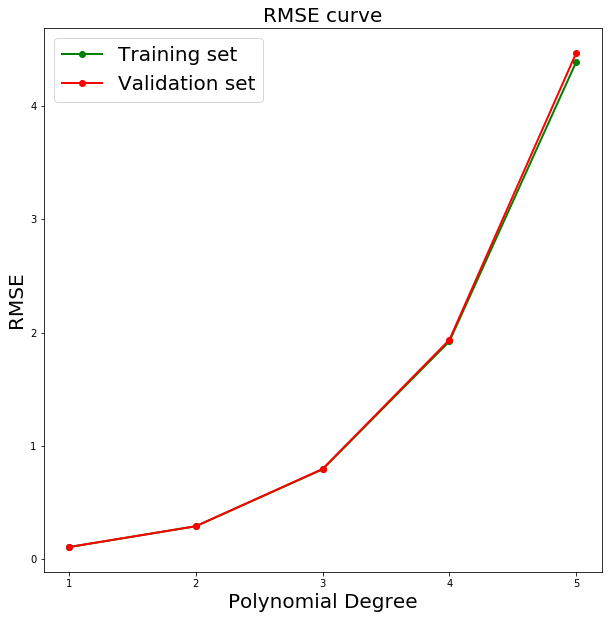

In [19]:
maxPolynomialDegree = 5
plot_polynomial_model_complexity(Linear_Regression, X_train, y_train, cv, maxPolynomialDegree, 
                                     learning_rate=0.1, epochs=100, tol=0.0001, regularizer=None, lambd=0)

In [20]:
linRg = Linear_Regression()
X_train = polynomialFeatures(X_train,5)
X_test = polynomialFeatures(X_test,5)

In [ ]:
X_train.shape
X_train = X_train[:600]
y_train = y_train[:600]

In [21]:

linRg.fit(X_train,y_train,learning_rate=0.0001,epochs=200,regularizer='l2',lambd= 1, tol=0.00001)

Epoch : 1     ||      Error : 21.752171186316737
Epoch : 2     ||      Error : 16.190064405037027
Epoch : 3     ||      Error : 13.319645458701839
Epoch : 4     ||      Error : 11.821767985943323
Epoch : 5     ||      Error : 11.023901689811913
Epoch : 6     ||      Error : 10.58317462510887
Epoch : 7     ||      Error : 10.32478155748993
Epoch : 8     ||      Error : 10.159601179900463
Epoch : 9     ||      Error : 10.04219565340555
Epoch : 10     ||      Error : 9.949397897794176
Epoch : 11     ||      Error : 9.869394945774578
Epoch : 12     ||      Error : 9.796162409048796
Epoch : 13     ||      Error : 9.726627052752225
Epoch : 14     ||      Error : 9.659220216434147
Epoch : 15     ||      Error : 9.593140317638147
Epoch : 16     ||      Error : 9.527976860612707
Epoch : 17     ||      Error : 9.463518747906644
Epoch : 18     ||      Error : 9.399656553444194
Epoch : 19     ||      Error : 9.336332699142
Epoch : 20     ||      Error : 9.27351605376619
Epoch : 21     ||      Erro

In [22]:

y_train_predicted_sgd = linRg.predict(X_train)
print(y_train_predicted_sgd)
y_test_predicted_sgd = linRg.predict(X_test)
print("Training: Mean squared error: %.2f"
      % mse(y_train, y_train_predicted_sgd))

print("Test: Mean squared error: %.2f"
      % mse(y_test, y_test_predicted_sgd))

[2.84837405 6.31395281 6.2191125  ... 5.61263604 8.10565901 3.2470637 ]
Training: Mean squared error: 3.13
Test: Mean squared error: 2.82


In [23]:
y_test_predicted_sgd = linRg.predict(X_test)
print("Test: Mean squared error: %.2f"
      % mse(y_test, y_test_predicted_sgd))

Test: Mean squared error: 2.82


In [22]:
linRg = SGD()
X_train = polynomialFeatures(X_train,3)
X_test = polynomialFeatures(X_test,3)

In [52]:

linRg.fit(X_train,y_train,learning_rate=1,epochs=1000,regularizer='l2',lambd= 0.1, tol=1)

Epochs needed: 1000


In [53]:

y_train_predicted_sgd = linRg.predict(X_train)
print(y_train_predicted_sgd)
y_test_predicted_sgd = linRg.predict(X_test)
print("Training: Mean squared error: %.2f"
      % mse(y_train, y_train_predicted_sgd))

print("Test: Mean squared error: %.2f"
      % mse(y_test, y_test_predicted_sgd))

[2.87393564 2.86914386 2.13018262 ... 1.89262196 2.09860504 2.21660794]
Training: Mean squared error: 10.00
Test: Mean squared error: 10.08
